# Setup

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import urllib.request
import uncertainty_toolbox as uct
import matplotlib as mpl
import matplotlib.font_manager as font_manager
urllib.request.urlretrieve('https://github.com/google/fonts/raw/main/ofl/ibmplexmono/IBMPlexMono-Regular.ttf', 'IBMPlexMono-Regular.ttf')
fe = font_manager.FontEntry(
    fname='IBMPlexMono-Regular.ttf',
    name='plexmono')
font_manager.fontManager.ttflist.append(fe)
plt.rcParams.update({'axes.facecolor':'#f5f4e9',
            'grid.color' : '#AAAAAA',
            'axes.edgecolor':'#333333',
            'figure.facecolor':'#FFFFFF',
            'axes.grid': False,
            'axes.prop_cycle':   plt.cycler('color', plt.cm.Dark2.colors),
            'font.family': fe.name,
            'figure.figsize': (3.5,3.5 / 1.2),
            'ytick.left': True,
            'xtick.bottom': True
           })

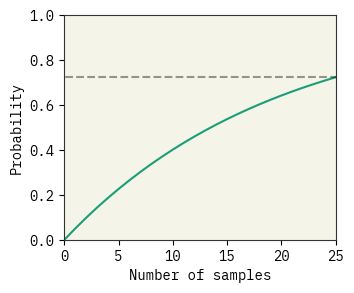

0.7233713985647542


In [2]:
from scipy.stats import binom
import matplotlib.pyplot as plt
n = 25
p = (0.05*12000)/12000
k = 0

dist = [1-binom.pmf(k, n, (0.05*12000)/(12000-n)) for n in range(n+1)]
plt.plot(range(n+1), dist)
plt.ylim(0,1)
plt.xlim(0,n)
plt.xlabel("Number of samples")
plt.ylabel("Probability")
plt.plot([-5,n+5], [dist[-1],dist[-1]], '--', color='black', alpha=0.4)
plt.show()
print(dist[-1])

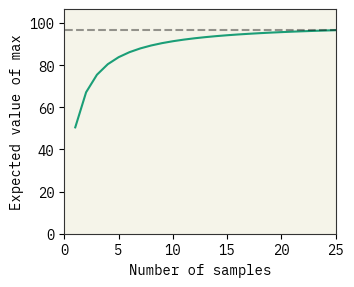

96.63303196611622


In [3]:
# s -> max
# l -> # of samples
# n -> number of classes (percentiles)

def combine(s, l):
  '''Number of combinations of l elements with max = s'''
  return (s**l - (s-1)**(l))

def prob(s, l, n):
  '''Probability of getting a sample with max([x0,x1,...,xl]) = s where xi={0,n}'''
  return combine(s,l) * ((1/n)**l)

def expected_value_p(l, n):
  '''Expected value of max([x0,x1,...,xl]) where xi={0,n}'''
  E = [s * prob(s, l, n) for s in range(1,100+1)]
  return sum(E)

def expected_value_q(l, n, data):
  '''Expected value of max([x0,x1,...,xl]) where xi={0,n}'''
  quants = [data.quantile(i/100) for i in range(100+1)]
  E = [((quants[s-1]+quants[s])/2) * prob(s, l, n) for s in range(1,100+1)]
  return sum(E)

data_path = "./paper/data/C2_yield_meth_oxy_short.csv"
raw_data = pd.read_csv(data_path)

l = 25
dist = [expected_value_p(li, 100) for li in range(1,l+1)]
# dist = [expected_value_q(li, 100, raw_data['completion']) for li in range(1,l+1)]
plt.plot(range(1,l+1), dist)
plt.ylim(0,max(dist)+10)
plt.xlim(0,l)
plt.xlabel("Number of samples")
plt.ylabel("Expected value of max")
plt.plot([-1,n+1], [dist[-1],dist[-1]], '--', color='black', alpha=0.4)
plt.show()
print(dist[-1])

# Loading results

In [32]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [33]:
df = pd.read_csv("ablation_results.csv", sep=';', encoding="ISO-8859-1")
df.columns
# df.iloc[47600]

Index(['y', 'yhat', 'yprobs', 'data', 'model', 'Temperature', 'k_selected',
       'N_train', 'model_class', 'n_tokens', 'x'],
      dtype='object')

In [34]:
df[df['model_class']=='topk'].groupby(['Temperature', 'data', 'k_selected', 'model_class', "N_train", "model"]).size().reset_index().sort_values(by=["model_class", "Temperature"])

,Temperature,data,k_selected,model_class,N_train,model,0
0,0.05,C2,0,topk,1000,text-curie-001,508
1,0.05,C2,0,topk,1000,text-davinci-003,388
2,0.05,C2,1,topk,1000,text-curie-001,319
3,0.05,C2,1,topk,1000,text-davinci-003,369
4,0.05,C2,2,topk,1000,text-curie-001,319
...,...,...,...,...,...,...,...
64,1.00,iupac-sol,5,topk,50,text-curie-001,501
65,1.00,iupac-sol,5,topk,100,text-curie-001,518
66,1.00,iupac-sol,5,topk,250,text-curie-001,520
67,1.00,iupac-sol,5,topk,500,text-curie-001,506


# Plotting

## templates

In [7]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import log_loss

def mse(y, pred):
  # return np.mean((y-pred)**2)
  return mean_squared_error(y, pred)

def mae(y, pred):
  return mean_absolute_error(y, pred)

def r2(y, pred):
  return r2_score(y, pred)

def corr(y, pred):
  return np.corrcoef(y, pred)[0,1]

def acc(y, pred, threshold):
  acc = sum((abs(pred - y)<threshold))/len(pred)
  return acc

def log_likelihood(y, pred, ystd, eps=0):
  y = np.array(y)
  pred = np.array(pred)
  ystd = np.array(ystd)
  yvar = ystd**2 + eps
  # neg_ll = 0.5 * (np.log(2 * np.pi * yvar) + ((y - pred)**2 / yvar))
  neg_ll = 0.5 * (np.log(yvar) + ((y - pred)**2 / yvar))
  return np.sum(neg_ll)/len(y)

def select_df(df, data, k, T, model, model_class, N):
  config = {'k': k,
            'T': T,
            'data': data,
            'model': model,
            'model_class': model_class,
            'N': N,
            }

  q = f""
  if T != 'any':
    q += f"Temperature=={T} and "
  if k != 'any':  
    q+= f"k_selected=={k} and "
  if model != 'any': 
    q+= f"model=='{model}' and "
  q+= f"model_class=='{model_class}' and "
  if N != 'any':
    q+= f"N_train=={N} and "
  q += f"data=='{data}'"
  sel = df.query(q)
  if sel.empty:
    raise ValueError(f"Dataframe is empty for the configuration {config}")
  return sel

In [8]:
def plot_parities(df, data_property, data_range, nrows, ncols, data=None, k=None, T=None, model=None, model_class=None, N=None, axis_name=None, out_name=None, GPR=False):
  config = {'k': k,
            'T': T,
            'data': data,
            'model': model,
            'model_class': model_class,
            'N': N,
            }

  if sum([1 for i in config.values() if i is None]) > 1:
    raise ValueError("Only the property being varied in data_range can me passed as None.")

  if nrows*ncols < len(data_range):
    raise ValueError('''There's not enough space to plat all data in data_range.
    Decrease the size of data_range or increase ncols or nrows.''')

  fig, axs = plt.subplots(nrows=nrows, ncols=ncols, sharey=False, figsize=(4*ncols, 4*nrows), dpi=300)
  for i, p in enumerate(data_range):
    config[data_property] = p
    y=[]
    yhat=[]
    yprob=[]
    ax = axs if ncols*nrows == 1 else axs.flatten()[i]

    df_sel = select_df(df, **config)

    for prompt in df_sel['x'].unique():
        y.append(df_sel[df_sel['x']==prompt]['y'].unique()[0])
        # max_p = np.argmax(df_sel[df_sel['y']==d]['yprobs'].values)
        yhat.append(df_sel[df_sel['x']==prompt]['yhat'].values)
        yprob.append(df_sel[df_sel['x']==prompt]['yprobs'].values)
    yprobs = [yhi.std() for yhi in yhat]
    if GPR:
        ymeans = np.array([yhi.mean() for yhi in yhat])
        ystds = np.array([ypi.mean() for ypi in yprob])
    else:
        ymeans = np.array([
                  np.sum(yhi*ypi) if len(yhi)>1 else yhi.mean()
                  for yhi,ypi in zip(yhat, yprob)
                ])
        ystds = np.array([
                  np.sqrt(np.sum((yhi-ymi)**2*ypi)) if yhi.std()>1 else ypi.mean()
                  for yhi,ypi,ymi in zip(yhat, yprob, ymeans)
                ])

    ax.plot(y,y)
    ax.errorbar(y, 
                ymeans, 
                yerr=ystds,
                fmt='.', color='gray', alpha=0.3)
    ax.scatter(
        y, ymeans, s=6, alpha=1, color=f"C{i}"
    )
    
    ax.set_title(f"{data_property}={p}")

    lim = (min(y), max(y))
    
    metrics = uct.metrics.get_all_metrics(ymeans, ystds, np.array(y), verbose=False)
    ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 1*0.1*(max(y)-min(y)), f"$(\\uparrow$)correlation = {metrics['accuracy']['corr']:.3f}")
    ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 2*0.1*(max(y)-min(y)), f"$(\\downarrow$)neg-ll = {metrics['scoring_rule']['nll']:.3f}")
    ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 3*0.1*(max(y)-min(y)), f"$(\\downarrow$)MAE = {metrics['accuracy']['mae']:.3f}")
    # ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 1*0.1*(max(y)-min(y)), f"$(\\uparrow$)correlation = {corr(y, ymeans):.3f}")
    # ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 2*0.1*(max(y)-min(y)), f"$(\\downarrow$)neg-ll = {log_likelihood(y, ymeans, ystds, eps=1e-6):.3f}")
    # ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 3*0.1*(max(y)-min(y)), f"$(\\downarrow$)MAE = {mae(y, ymeans):.3f}")

    ax.set_ylim(lim[0],lim[1])
    ax.set_xlim(lim[0],lim[1])

    ax.set_xlabel(f"measured {axis_name}")
    if (i%ncols==0):
      ax.set_ylabel(f"predicted {axis_name}")

  plt.tight_layout()
  # plt.show()
  if (out_name):
    plt.savefig(f"figs/{out_name}", dpi=300)

In [9]:
def plot_ablation(df, data_property, data_range, nrows, ncols, data=None, k=None, T=None, model=None, model_class=None, N=None, out_name=None, GPR=False):
  config = {'k': k,
            'T': T,
            'data': data,
            'model': model,
            'model_class': model_class,
            'N': N,
            }

  MAE_list = []
  RMSE_list = []
  r_list = []
  nll_list = []
  prop_list = []
  for i, p in enumerate(data_range):
    config[data_property] = p
    y=[]
    yhat=[]
    yprobs=[]
    yprob=[]	

    df_sel = select_df(df, **config)

    for prompt in df_sel['x'].unique():
        y.append(df_sel[df_sel['x']==prompt]['y'].unique()[0])
        # max_p = np.argmax(df_sel[df_sel['y']==d]['yprobs'].values)
        yhat.append(df_sel[df_sel['x']==prompt]['yhat'].values)
        yprob.append(df_sel[df_sel['x']==prompt]['yprobs'].values)
    yprobs = [yhi.std() for yhi in yhat]
    if GPR:
        ymeans = np.array([yhi.mean() for yhi in yhat])
        ystds = np.array([ypi.mean() for ypi in yprob])
    else:
        ymeans = np.array([
                  np.sum(yhi*ypi) if len(yhi)>1 else yhi.mean()
                  # yhi.mean() if len(yhi)>1 else 5
                  # yhi.mean()
                  for yhi,ypi in zip(yhat, yprob)
                ])
        ystds = np.array([
                  np.sqrt(np.sum((yhi-ymi)**2*ypi)) if yhi.std()>1 else ypi.mean()
                  # yhi.std() if len(yhi)>1 else max(yprobs) for yhi in yhat
                  for yhi,ypi,ymi in zip(yhat, yprob, ymeans)
                ])

    metrics = uct.metrics.get_all_metrics(ymeans, ystds, np.array(y), verbose=False)
    r_list.append(metrics['accuracy']['corr'])
    RMSE_list.append(metrics['accuracy']['rmse'])
    MAE_list.append(metrics['accuracy']['mae'])
    nll_list.append(metrics['scoring_rule']['nll'])
    prop_list.append(p)
    print(f"{model_class}(N:{config['N']}/k:{config['k']}/T:{config['T']}) => RMSE: | MAE: {MAE_list[-1]} | r: {r_list[-1]} | nll: {nll_list[-1]}")

  fig, axs = plt.subplots(nrows=nrows, ncols=ncols, sharey=False, figsize=(4*ncols, 4*nrows), dpi=300)
  
  axs[0].plot(prop_list, MAE_list)
  axs[0].set_xlabel(data_property)
  axs[0].set_ylabel("$\\rightarrow$MAE")
  
  axs[1].plot(prop_list, r_list)
  axs[1].set_xlabel(data_property)
  axs[1].set_ylabel("$\\leftarrow$correlation")

  axs[2].plot(prop_list, nll_list)
  axs[2].set_xlabel(data_property)
  axs[2].set_yscale('log')
  axs[2].set_ylabel("$\\rightarrow$negative log-likelihood")

  plt.tight_layout()
  # plt.show()
  if (out_name):
    plt.savefig(f"figs/{out_name}", dpi=300)

## Paper Figures

In [59]:
def create_sub_ablation(axs, df, lims, data_property, data_range, color='C0', data=None, k=None, T=None, model=None, model_class=None, N=None, label=False, GPR=False):
  config = {'k': k,
            'T': T,
            'data': data,
            'model': model,
            'model_class': model_class,
            'N': N,
            }

  MAE_list = []
  RMSE_list = []
  r_list = []
  nll_list = []
  prop_list = []
  for i, p in enumerate(data_range):
    config[data_property] = p
    y=[]
    yhat=[]
    yprobs=[]
    yprob=[]

    df_sel = select_df(df, **config)

    for prompt in df_sel['x'].unique():
        y.append(df_sel[df_sel['x']==prompt]['y'].unique()[0])
        # max_p = np.argmax(df_sel[df_sel['y']==d]['yprobs'].values)
        yhat.append(df_sel[df_sel['x']==prompt]['yhat'].values)
        yprob.append(df_sel[df_sel['x']==prompt]['yprobs'].values)
    yprobs = [yhi.std() for yhi in yhat]
    if GPR:
        ymeans = np.array([yhi.mean() for yhi in yhat])
        ystds = np.array([ypi.mean() for ypi in yprob])
    else:
        ymeans = np.array([
                  np.sum(yhi*ypi) if len(yhi)>1 else yhi.mean()
                  for yhi,ypi in zip(yhat, yprob)
                ])
        ystds = np.array([
                  np.sqrt(np.sum((yhi-ymi)**2*ypi)) if np.sum((yhi-ymi)**2*ypi)>0 else ypi.mean()
                  for yhi,ypi,ymi in zip(yhat, yprob, ymeans)
                ])
    # print(ystds)
    if model_class in ["KRR", "KNN"]:
       metrics = {
          "accuracy": uct.metrics.get_all_accuracy_metrics(ymeans, np.array(y), verbose=False)
                  }
    else:
      metrics = uct.metrics.get_all_metrics(ymeans, ystds, np.array(y), verbose=False)
      nll_list.append(metrics['scoring_rule']['nll'])
    r_list.append(metrics['accuracy']['corr'])
    RMSE_list.append(metrics['accuracy']['rmse'])
    MAE_list.append(metrics['accuracy']['mae'])
    prop_list.append(p)
    # print(f"{model_class}(N:{config['N']}/k:{config['k']}/T:{config['T']}) => RMSE: | MAE: {MAE_list[-1]} | r: {r_list[-1]} | nll: {nll_list[-1]}")

  for ax in axs:
    ax.label_outer()

  if label:
    if model_class=="GPR-BOT":
      axs[0].plot(prop_list, MAE_list, label="GPR", color=color)
    else:
      axs[0].plot(prop_list, MAE_list, label=model_class, color=color)
  else:
    axs[0].plot(prop_list, MAE_list, color=color)
  # axs[0].set_xlabel(data_property)
  axs[0].set_ylabel("MAE\n$\leftarrow$")
  axs[0].set_ylim(lims[0])
  axs[0].set_label(model_class)
  
  axs[1].plot(prop_list, r_list, color=color)
  # axs[1].set_xlabel(data_property)
  axs[1].set_ylabel("r\n$\\rightarrow$")
  axs[1].set_ylim(lims[1])
  axs[1].set_label(model_class)

  if model_class not in ["KRR", "KNN"]:
    axs[2].plot(prop_list, nll_list, color=color)
    axs[2].set_xlabel(data_property)
    axs[2].set_yscale('log')
    axs[2].set_ylabel("neg-ll\n$\leftarrow$")
    # axs[1].set_label(model_class)

  for ax in axs:
    ax.label_outer()

In [61]:
import numpy as np
import matplotlib.pyplot as plt

#figsize=(6.4,4.8)
# fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(16,8), constrained_layout=True)
fig = plt.figure(figsize=(12,6), constrained_layout=True)
subfigs = fig.subfigures(1,2, wspace=0.1, hspace=0.1)

sub00 = subfigs[0].subplots(3,1, sharex=True, sharey=False)
lims_sol = [(0.8,2),(0,1),(-1,1)]

d00 = select_df(df, data="iupac-sol", k=5, T=1.0, model='text-curie-001', model_class='multi', N='any')
create_sub_ablation(sub00, d00, lims_sol, 'N', sorted(d00['N_train'].unique()), data='iupac-sol', color='C1', k=5, T=1.0, model='text-curie-001', model_class='multi', N=None, label=True)

d01 = select_df(df, data="iupac-sol", k=5, T=1.0, model='text-curie-001', model_class='topk', N='any')
create_sub_ablation(sub00, d01, lims_sol, 'N', sorted(d01['N_train'].unique()), data='iupac-sol', color='C2', k=5, T=1.0, model='text-curie-001', model_class='topk', N=None, label=True)

# d02 = select_df(df, data="iupac-sol", k=0, T=0.05, model='any', model_class='finetune', N='any')
# create_sub_ablation(sub00, d02, lims_sol, 'N', sorted(d02['N_train'].unique()), data='iupac-sol', color='C3', k=0, T=0.05, model='any', model_class='finetune', N=None, label=True)

# d03 = select_df(df, data="iupac-sol", k=32, T=0.05, model='text-ada-001', model_class='GPR-BOT', N='any')
# create_sub_ablation(sub00, d03, lims_sol, 'N', sorted(d03['N_train'].unique()), data='iupac-sol', color='C4', k=32, T=0.05, model='text-ada-001', model_class='GPR-BOT', N=None, GPR=True, label=True)

# d04 = select_df(df, data="iupac-sol", k=0, T=0.05, model='text-ada-001', model_class='KRR', N='any')
# create_sub_ablation(sub00, d04, lims_sol, 'N', sorted(d04['N_train'].unique()), data='iupac-sol', color='C5', k=0, T=0.05, model='text-ada-001', model_class='KRR', N=None, GPR=True, label=True)

d05 = select_df(df, data="iupac-sol", k=1, T=0.05, model='text-ada-001', model_class='KNN', N='any')
create_sub_ablation(sub00, d05, lims_sol, 'N', sorted(d05['N_train'].unique()), data='iupac-sol', color='C6', k=1, T=0.05, model='text-ada-001', model_class='KNN', N=None, GPR=True, label=True)


sub10 = subfigs[1].subplots(3,1, sharex=True, sharey=False)
lims_c2 =  [(1.2,5),(0,1),(-1,1)]

d10 = select_df(df, data="C2", k=5, T=1.0, model='text-curie-001', model_class='multi', N='any')
create_sub_ablation(sub10, d10, lims_c2, 'N', sorted(d10['N_train'].unique()), color="C1", data='C2', k=5, T=1.0, model='text-curie-001', model_class='multi', N=None)

d11 = select_df(df, data="C2", k=5, T=1.0, model='text-curie-001', model_class='topk', N='any')
create_sub_ablation(sub10, d11, lims_c2, 'N', sorted(d11['N_train'].unique()), color="C2", data='C2', k=5, T=1.0, model='text-curie-001', model_class='topk', N=None)

# d12 = select_df(df, data="C2", k=0, T=0.05, model='any', model_class='finetune', N='any')
# create_sub_ablation(sub10, d12, lims_c2, 'N', sorted(d12['N_train'].unique()), color="C3", data='C2', k=0, T=0.05, model='any', model_class='finetune', N=None)

# d13 = select_df(df, data="C2", k=32, T=0.05, model='text-ada-001', model_class='GPR-BOT', N='any')
# create_sub_ablation(sub10, d13, lims_c2, 'N', sorted(d13['N_train'].unique()), color="C4", data='C2', k=32, T=0.05, model='text-ada-001', model_class='GPR-BOT', N=None, GPR=True)

# d14 = select_df(df, data="C2", k=0, T=0.05, model='text-ada-001', model_class='KRR', N='any')
# create_sub_ablation(sub10, d14, lims_c2, 'N', sorted(d14['N_train'].unique()), color="C5", data='C2', k=0, T=0.05, model='text-ada-001', model_class='KRR', N=None, GPR=True)

d15 = select_df(df, data="C2", k=1, T=0.05, model='text-ada-001', model_class='KNN', N='any')
create_sub_ablation(sub10, d15, lims_c2, 'N', sorted(d15['N_train'].unique()), color="C6", data='C2', k=1, T=0.05, model='text-ada-001', model_class='KNN', N=None, GPR=True)

bbox_props = dict(boxstyle="square", fc='#f5f4e9', ec="gray", lw=1)
subfigs[0].text(0.5, 1.05, "Solubility", ha="left", va="bottom", rotation=0,
            size=15, bbox=bbox_props)
subfigs[1].text(0.5, 1.05, "C$_2$ yield", ha="left", va="bottom", rotation=0,
            size=15, bbox=bbox_props)

fig.legend(loc='upper center', bbox_to_anchor=(0.5 ,0),
          fancybox=True, shadow=True, ncol=6)
plt.show()

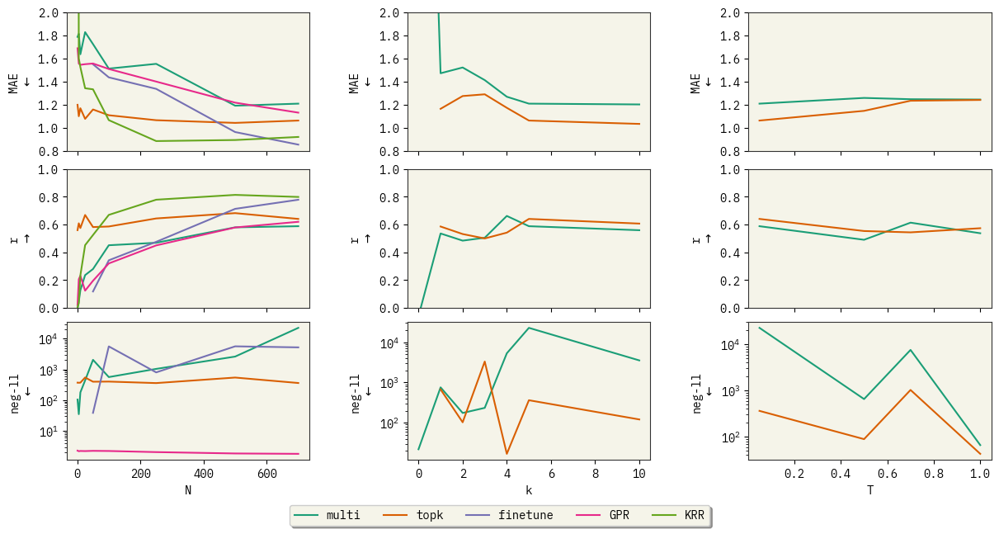

In [28]:
import numpy as np
import matplotlib.pyplot as plt

#figsize=(6.4,4.8)
fig = plt.figure(figsize=(12,6), constrained_layout=True)
subfigs = fig.subfigures(1,3, wspace=0.1, hspace=0.1)

sub00 = subfigs[0].subplots(3,1, sharex=True, sharey=False)
lims_sol = [(0.8,2),(0,1),(-1,1)]
d00 = select_df(df, data="iupac-sol", k=5, T=0.05, model='text-curie-001', model_class='multi', N='any')
create_sub_ablation(sub00, d00, lims_sol, 'N', sorted(d00['N_train'].unique()), data='iupac-sol', k=5, T=0.05, model='text-curie-001', model_class='multi', N=None, label=True)
d01 = select_df(df, data="iupac-sol", k=5, T=0.05, model='text-curie-001', model_class='topk', N='any')
create_sub_ablation(sub00, d01, lims_sol, 'N', sorted(d01['N_train'].unique()), data='iupac-sol', k=5, T=0.05, model='text-curie-001', model_class='topk', N=None, label=True)
d02 = select_df(df, data="iupac-sol", k=0, T=0.05, model='any', model_class='finetune', N='any')
create_sub_ablation(sub00, d02, lims_sol, 'N', sorted(d02['N_train'].unique()), data='iupac-sol', k=0, T=0.05, model='any', model_class='finetune', N=None, label=True)
d03 = select_df(df, data="iupac-sol", k=32, T=0.05, model='text-ada-001', model_class='GPR-BOT', N='any')
create_sub_ablation(sub00, d03, lims_sol, 'N', sorted(d03['N_train'].unique()), data='iupac-sol', k=32, T=0.05, model='text-ada-001', model_class='GPR-BOT', N=None, GPR=True, label=True)
d04 = select_df(df, data="iupac-sol", k=0, T=0.05, model='text-ada-001', model_class='KRR', N='any')
create_sub_ablation(sub00, d04, lims_sol, 'N', sorted(d04['N_train'].unique()), data='iupac-sol', k=0, T=0.05, model='text-ada-001', model_class='KRR', N=None, GPR=True, label=True)

sub10 = subfigs[1].subplots(3,1, sharex=True, sharey=False)
d10 = select_df(df, data="iupac-sol", k='any', T=0.05, model='text-curie-001', model_class='multi', N=700)
create_sub_ablation(sub10, d10, lims_sol, 'k', sorted(d10['k_selected'].unique()), data='iupac-sol', k=None, T=0.05, model='text-curie-001', model_class='multi', N=700)
d11 = select_df(df, data="iupac-sol", k='any', T=0.05, model='text-curie-001', model_class='topk', N=700)
create_sub_ablation(sub10, d11, lims_sol, 'k', [1,2,3,4,5,10], data='iupac-sol', k=None, T=0.05, model='text-curie-001', model_class='topk', N=700)

sub20 = subfigs[2].subplots(3,1, sharex=True, sharey=False)
d20 = select_df(df, data="iupac-sol", k=5, T='any', model='text-curie-001', model_class='multi', N='any')
create_sub_ablation(sub20, d20, lims_sol, 'T', sorted(d20['Temperature'].unique()), data='iupac-sol', k=5, T=None, model='text-curie-001', model_class='multi', N=700)
d21 = select_df(df, data="iupac-sol", k=5, T='any', model='text-curie-001', model_class='topk', N='any')
create_sub_ablation(sub20, d21, lims_sol, 'T', sorted(d20['Temperature'].unique()), data='iupac-sol', k=5, T=None, model='text-curie-001', model_class='topk', N=700)

bbox_props = dict(boxstyle="square", fc='#f5f4e9', ec="gray", lw=1)

fig.legend(loc='upper center', bbox_to_anchor=(0.5 ,0),
          fancybox=True, shadow=True, ncol=5)
plt.show()

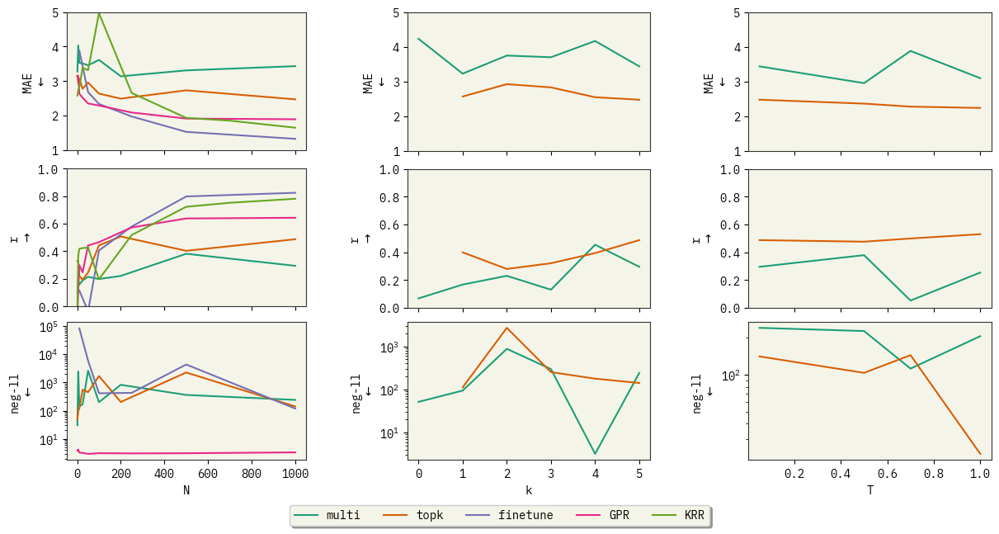

In [16]:
import numpy as np
import matplotlib.pyplot as plt

#figsize=(6.4,4.8)
fig = plt.figure(figsize=(12,6), constrained_layout=True)
subfigs = fig.subfigures(1,3, wspace=0.1, hspace=0.1)

sub00 = subfigs[0].subplots(3,1, sharex=True, sharey=False)
lims_c2 = [(1,5),(0,1),(-1,1)]
d00 = select_df(df, data="C2", k=5, T=0.05, model='text-curie-001', model_class='multi', N='any')
create_sub_ablation(sub00, d00, lims_c2, 'N', sorted(d00['N_train'].unique()), data='C2', k=5, T=0.05, model='text-curie-001', model_class='multi', N=None, label=True)
d01 = select_df(df, data="C2", k=5, T=0.05, model='text-curie-001', model_class='topk', N='any')
create_sub_ablation(sub00, d01, lims_c2, 'N', sorted(d01['N_train'].unique()), data='C2', k=5, T=0.05, model='text-curie-001', model_class='topk', N=None, label=True)
d02 = select_df(df, data="C2", k=0, T=0.05, model='any', model_class='finetune', N='any')
create_sub_ablation(sub00, d02, lims_c2, 'N', sorted(d02['N_train'].unique()), data='C2', k=0, T=0.05, model='any', model_class='finetune', N=None, label=True)
d03 = select_df(df, data="C2", k=32, T=0.05, model='text-ada-001', model_class='GPR-BOT', N='any')
create_sub_ablation(sub00, d03, lims_c2, 'N', sorted(d03['N_train'].unique()), data='C2', k=32, T=0.05, model='text-ada-001', model_class='GPR-BOT', N=None, GPR=True, label=True)
d04 = select_df(df, data="C2", k=0, T=0.05, model='text-ada-001', model_class='KRR', N='any')
create_sub_ablation(sub00, d04, lims_c2, 'N', sorted(d04['N_train'].unique()), data='C2', k=0, T=0.05, model='text-ada-001', model_class='KRR', N=None, GPR=True, label=True)

sub10 = subfigs[1].subplots(3,1, sharex=True, sharey=False)
d10 = select_df(df, data="C2", k='any', T=0.05, model='text-curie-001', model_class='multi', N=1000)
create_sub_ablation(sub10, d10, lims_c2, 'k', sorted(d10['k_selected'].unique()), data='C2', k=None, T=0.05, model='text-curie-001', model_class='multi', N=1000)
d11 = select_df(df, data="C2", k='any', T=0.05, model='text-curie-001', model_class='topk', N=1000)
create_sub_ablation(sub10, d11, lims_c2, 'k', [1,2,3,4,5], data='C2', k=None, T=0.05, model='text-curie-001', model_class='topk', N=1000)


sub20 = subfigs[2].subplots(3,1, sharex=True, sharey=False)
d20 = select_df(df, data="C2", k=5, T='any', model='text-curie-001', model_class='multi', N='any')
create_sub_ablation(sub20, d20, lims_c2, 'T', sorted(d20['Temperature'].unique()), data='C2', k=5, T=None, model='text-curie-001', model_class='multi', N=1000)
d21 = select_df(df, data="C2", k=5, T='any', model='text-curie-001', model_class='topk', N='any')
create_sub_ablation(sub20, d21, lims_c2, 'T', sorted(d20['Temperature'].unique()), data='C2', k=5, T=None, model='text-curie-001', model_class='topk', N=1000)

bbox_props = dict(boxstyle="square", fc='#f5f4e9', ec="gray", lw=1)

fig.legend(loc='upper center', bbox_to_anchor=(0.5 ,0),
          fancybox=True, shadow=True, ncol=5)
plt.show()

In [ ]:
def create_sub_parity(ax, df_sel, axis_name, lim=[-1,1], color='gray', GPR=False):
    y=[]
    yhat=[]
    yprob=[]
    for prompt in df_sel['x'].unique():
        y.append(df_sel[df_sel['x']==prompt]['y'].unique()[0])
        # max_p = np.argmax(df_sel[df_sel['y']==d]['yprobs'].values)
        yhat.append(df_sel[df_sel['x']==prompt]['yhat'].values)
        yprob.append(df_sel[df_sel['x']==prompt]['yprobs'].values)
    yprobs = [yhi.std() for yhi in yhat]
    if GPR:
        ymeans = np.array([yhi.mean() for yhi in yhat])
        ystds = np.array([ypi.mean() for ypi in yprob])
    else:
        ymeans = np.array([
                  np.sum(yhi*ypi) if len(yhi)>1 else yhi.mean()
                  for yhi,ypi in zip(yhat, yprob)
                ])
        ystds = np.array([
                  np.sqrt(np.sum((yhi-ymi)**2*ypi)) if len(yhi)>1 else ypi.mean()
                  for yhi,ypi,ymi in zip(yhat, yprob, ymeans)
                ])
    
    ax.set_xlabel(f"measured {axis_name}")
    ax.set_ylabel(f"predicted {axis_name}")
    ax.set_ylim(lim[0],lim[1])
    ax.set_xlim(lim[0],lim[1])

    metrics = uct.metrics.get_all_metrics(ymeans, ystds, np.array(y), verbose=False)
    ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 1*0.1*(max(y)-min(y)), f"$(\\uparrow$)correlation = {metrics['accuracy']['corr']:.3f}")
    ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 2*0.1*(max(y)-min(y)), f"$(\\downarrow$)neg-ll = {metrics['scoring_rule']['nll']:.3f}")
    ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 3*0.1*(max(y)-min(y)), f"$(\\downarrow$)MAE = {metrics['accuracy']['mae']:.3f}")
    # ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 1*0.1*(max(y)-min(y)), f"$(\\uparrow$)correlation = {corr(y, ymeans):.3f}")
    # ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 2*0.1*(max(y)-min(y)), f"$(\\downarrow$)neg-ll = {log_likelihood(y, ymeans, ystds, eps=1e-6):.3f}")
    # ax.text(lim[0] + 0.1*(max(y)-min(y)), lim[1] - 3*0.1*(max(y)-min(y)), f"$(\\downarrow$)MAE = {mae(y, ymeans):.3f}")
    print(np.sqrt(mse(y, ymeans)))

    ax.plot(y,y)
    ax.plot(lim,lim)
    ax.errorbar(y, 
                ymeans, 
                yerr=ystds,
                fmt='.', color='gray', alpha=0.3)
    ax.scatter(
        y, ymeans, s=6, alpha=1, color=color
    )

1.7566911668147236
1.6583741741565707
1.254348427662178
1.5582817741258281
4.3958482834514445
3.2518445282406234
1.936407887846575
2.464328436933092


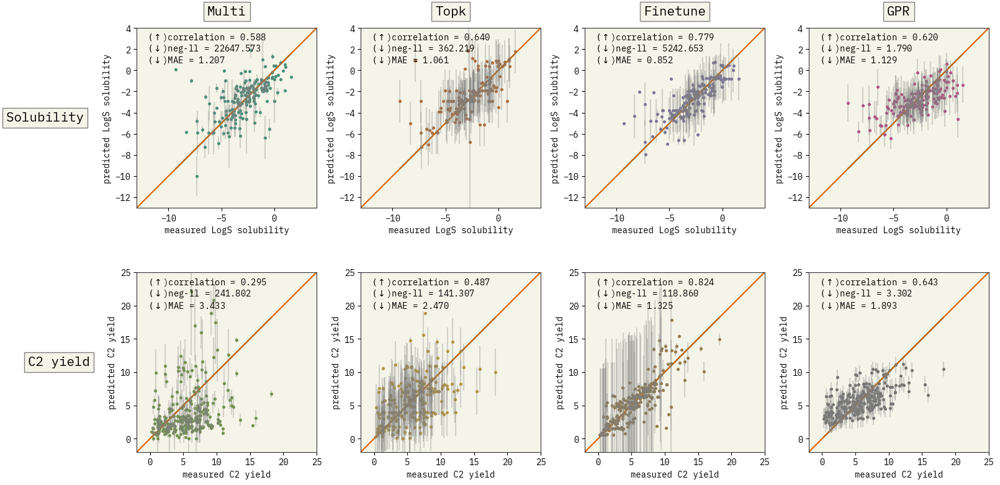

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

#figsize=(6.4,4.8)
fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(16,8), constrained_layout=True)
for ax in axs.flat:
    ax.set_aspect(1)

# plot axs[0,0]
d00 = select_df(df, data="iupac-sol", k=5, T=0.05, model='text-curie-001', model_class='multi', N=700)
lim_sol = (min(d00['y']), max(d00['y']))
lim_sol = (-13,4)
text_anchor = sum(lim_sol)/len(lim_sol)
create_sub_parity(axs[0,0], d00, 'LogS solubility', lim=lim_sol, color=f'C0')
# plot axs[0,1]
d01 = select_df(df, data="iupac-sol", k=5, T=0.05, model='text-curie-001', model_class='topk', N=700)
create_sub_parity(axs[0,1], d01, 'LogS solubility', lim=lim_sol, color=f'C1')
# plot axs[0,2]
d02 = select_df(df, data="iupac-sol", k=0, T=0.05, model='any', model_class='finetune', N=700)
create_sub_parity(axs[0,2], d02, 'LogS solubility', lim=lim_sol, color=f'C2')
# plot axs[0,3]
d03 = select_df(df, data="iupac-sol", k=32, T=0.05, model='text-ada-001', model_class='GPR-BOT', N=700)
create_sub_parity(axs[0,3], d03, 'LogS solubility', lim=lim_sol, color=f'C3', GPR=True)

# plot axs[1,0]
d10 = select_df(df, data="C2", k=5, T=0.05, model='text-curie-001', model_class='multi', N=1000)
lim_c2 = (min(d10['y']), max(d10['y']))
lim_c2 = (-2, 25)
create_sub_parity(axs[1,0], d10, 'C2 yield', lim=lim_c2, color=f'C4')
# plot axs[1,1]
d11 = select_df(df, data="C2", k=5, T=0.05, model='text-curie-001', model_class='topk', N=1000)
lim = (min(d11['y']), max(d11['y']))
create_sub_parity(axs[1,1], d11, 'C2 yield', lim=lim_c2, color=f'C5')
# plot axs[1,2]
d12 = select_df(df, data="C2", k=0, T=0.05, model='any', model_class='finetune', N=1000)
lim = (min(d12['y']), max(d12['y']))
create_sub_parity(axs[1,2], d12, 'C2 yield', lim=lim_c2, color=f'C6')
# plot axs[1,3]
d13 = select_df(df, data="C2", k=32, T=0.05, model='text-ada-001', model_class='GPR-BOT', N=1000)
create_sub_parity(axs[1,3], d13, 'C2 yield', lim=lim_c2, color=f'C7', GPR=True)


anchor_x = (lim_sol[1]+lim_sol[0])/2
anchor_y = lim_sol[1] + 1
bbox_props = dict(boxstyle="square", fc='#f5f4e9', ec="gray", lw=1)
axs[0,0].text(anchor_x, anchor_y, "Multi", ha="center", va="bottom", rotation=0,
            size=15, bbox=bbox_props)
axs[0,1].text(anchor_x, anchor_y, "Topk", ha="center", va="bottom", rotation=0,
            size=15, bbox=bbox_props)
axs[0,2].text(anchor_x, anchor_y, "Finetune", ha="center", va="bottom", rotation=0,
            size=15, bbox=bbox_props)
axs[0,3].text(anchor_x, anchor_y, "GPR", ha="center", va="bottom", rotation=0,
            size=15, bbox=bbox_props)

axs[0,0].text(lim_sol[0]-5, (lim_sol[1]+lim_sol[0])/2, "Solubility", ha="right", va="center", rotation=0,
            size=15, bbox=bbox_props)
axs[1,0].text(lim_c2[0]-7, (lim_c2[1]+lim_c2[0])/2, "C2 yield", ha="right", va="center", rotation=0,
            size=15, bbox=bbox_props)

plt.show()

## C2

In [20]:
c2_data = df[(df['data'] == 'C2')]
c2_data.groupby(['Temperature', 'data', 'k_selected', 'model_class', "N_train", "model"]).size().reset_index().sort_values(by=["model_class", "Temperature"])

,Temperature,data,k_selected,model_class,N_train,model,0
0,0.05,C2,0,GPR,1,text-ada-001,2542
1,0.05,C2,0,GPR,5,text-ada-001,2542
2,0.05,C2,0,GPR,10,text-ada-001,2542
3,0.05,C2,0,GPR,25,text-ada-001,2542
4,0.05,C2,0,GPR,50,text-ada-001,2542
...,...,...,...,...,...,...,...
141,0.50,C2,5,topk,1000,text-davinci-003,1107
144,0.70,C2,5,topk,1000,gpt-4,1179
145,0.70,C2,5,topk,1000,text-curie-001,986
146,0.70,C2,5,topk,1000,text-davinci-003,1147


### multi

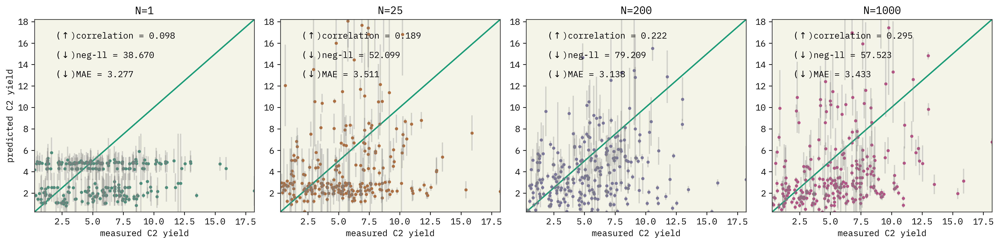

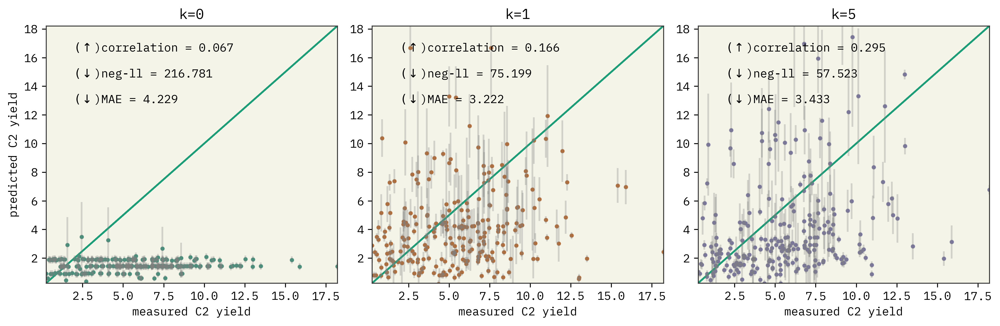

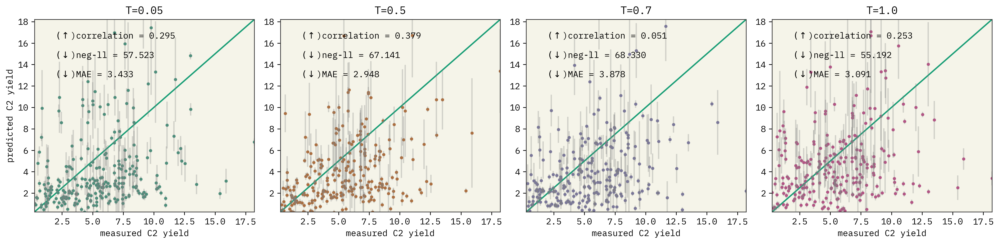

In [17]:
plot_parities(c2_data, 
              'N', 
              [1,25,200,1000],#sorted(c2_data[(c2_data['model_class']=="multi") & (c2_data['model']=="text-curie-001")]['N_train'].unique()), 
              nrows=1, ncols=4,
              data='C2',
              k=5,
              T=0.05,
              model='text-curie-001',
              model_class='multi',
              N=None,
              axis_name="C2 yield",
              out_name="par_C2_multi_N_curie.png")

plot_parities(c2_data, 
              'k', 
              [0,1,5], #sorted(c2_data[(c2_data['model_class']=="multi") & (c2_data['model']=="text-curie-001")]['k_selected'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=None,
              T=0.05,
              model='text-curie-001',
              model_class='multi',
              N=1000,
              axis_name="C2 yield",
              out_name="par_C2_multi_k_curie.png")

plot_parities(c2_data, 
              'T', 
              [0.05, 0.5, 0.7, 1.0], #sorted(c2_data[(c2_data['model_class']=="multi") & (c2_data['model']=="text-curie-001")]['Temperature'].unique()), 
              nrows=1, ncols=4,
              data='C2',
              k=5,
              T=None,
              model='text-curie-001',
              model_class='multi',
              N=1000,
              axis_name="C2 yield",
              out_name="par_C2_multi_T_curie.png")

multi(N:1/k:5/T:0.05) => RMSE: | MAE: 3.2773274133858266 | r: 0.09777892937549872 | nll: 38.669612347646876
multi(N:5/k:5/T:0.05) => RMSE: | MAE: 4.031287755905512 | r: 0.18723022985332274 | nll: 103.63927475563293
multi(N:10/k:5/T:0.05) => RMSE: | MAE: 3.5276951929133857 | r: 0.15953834289696736 | nll: 57.77361225574306
multi(N:25/k:5/T:0.05) => RMSE: | MAE: 3.5114555511811023 | r: 0.1888077448540586 | nll: 52.099022428812106
multi(N:50/k:5/T:0.05) => RMSE: | MAE: 3.4573818543307087 | r: 0.21509406772850237 | nll: 71.87505900657489
multi(N:100/k:5/T:0.05) => RMSE: | MAE: 3.613360125984252 | r: 0.19878234312789358 | nll: 55.57783364212224
multi(N:200/k:5/T:0.05) => RMSE: | MAE: 3.137980763779528 | r: 0.22157153823086137 | nll: 79.20868275878794
multi(N:500/k:5/T:0.05) => RMSE: | MAE: 3.3092382834645675 | r: 0.38203062087904804 | nll: 66.07592444108718
multi(N:1000/k:5/T:0.05) => RMSE: | MAE: 3.432726535433071 | r: 0.2946998722614603 | nll: 57.52251297336628
multi(N:1000/k:0/T:0.05) => 

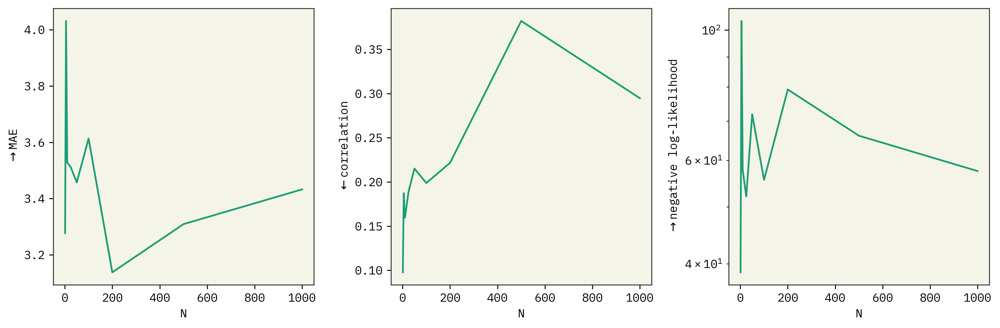

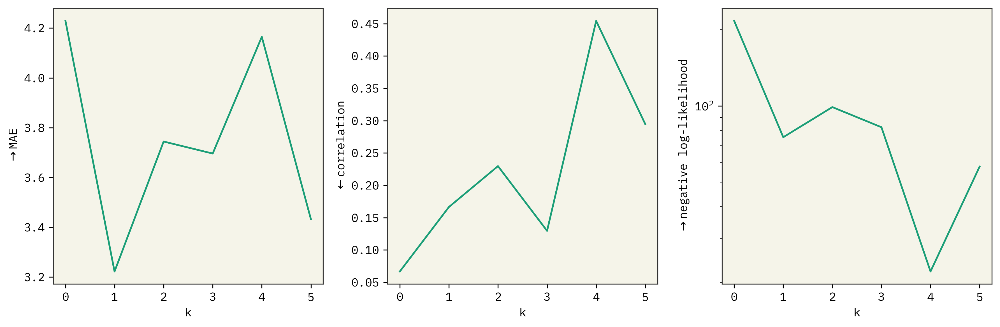

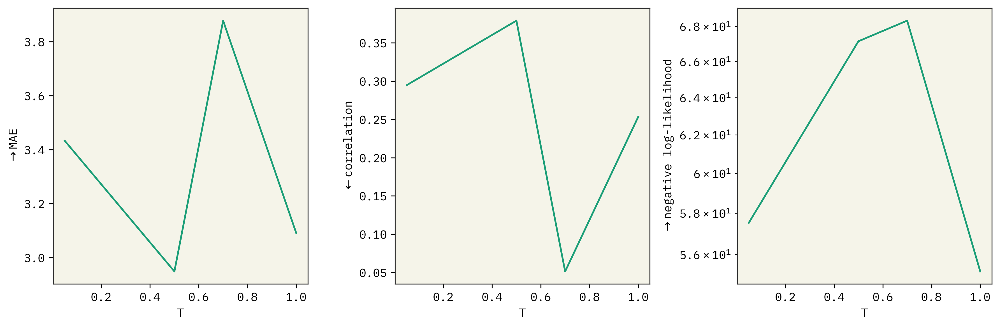

In [18]:
plot_ablation(c2_data, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="multi") & (c2_data['model']=="text-curie-001")]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=5,
              T=0.05,
              model='text-curie-001',
              model_class='multi',
              N=None,
              out_name="ablation_C2_multi_N_curie.png")

plot_ablation(c2_data, 
              'k', 
              sorted(c2_data[(c2_data['model_class']=="multi") & (c2_data['model']=="text-curie-001")]['k_selected'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=None,
              T=0.05,
              model='text-curie-001',
              model_class='multi',
              N=1000,
              out_name="ablation_C2_multi_k_curie.png")

plot_ablation(c2_data, 
              'T', 
              sorted(c2_data[(c2_data['model_class']=="multi") & (c2_data['model']=="text-curie-001")]['Temperature'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=5,
              T=None,
              model='text-curie-001',
              model_class='multi',
              N=1000,
              out_name="ablation_C2_multi_T_curie.png")



### multi-davinci

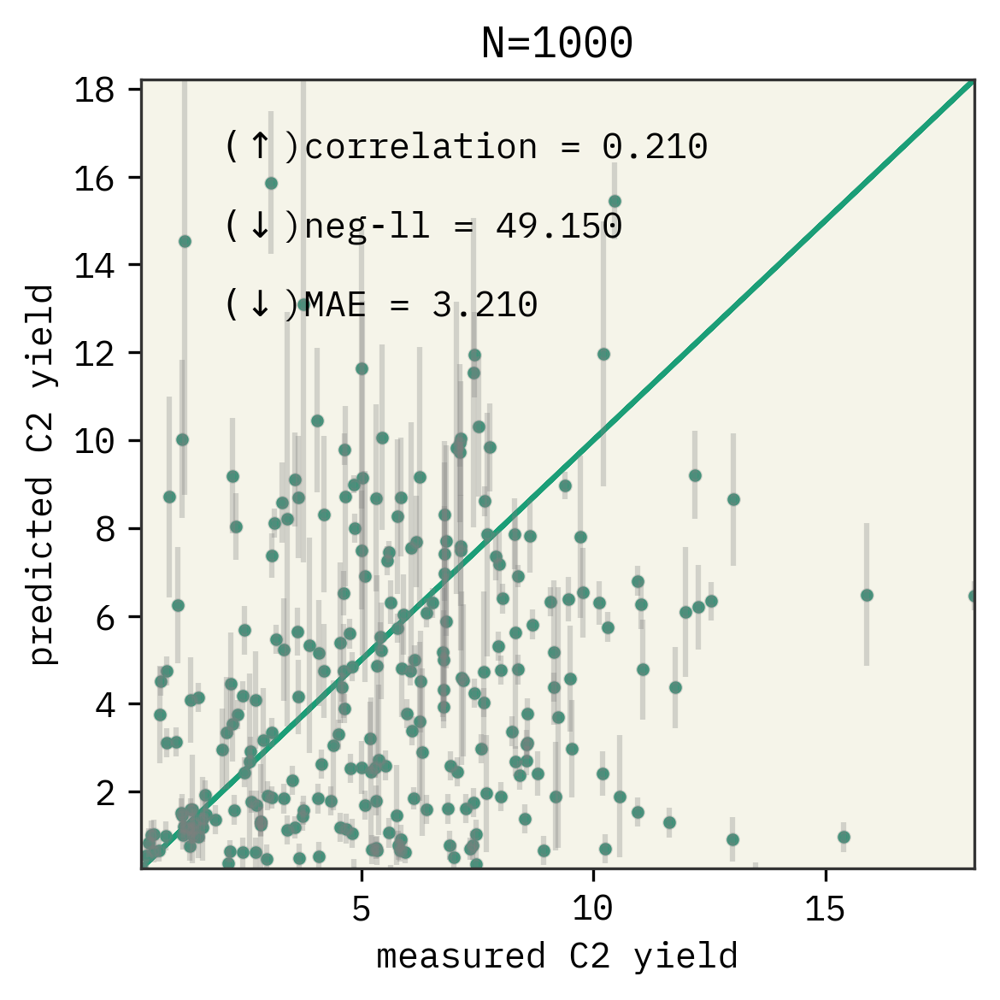

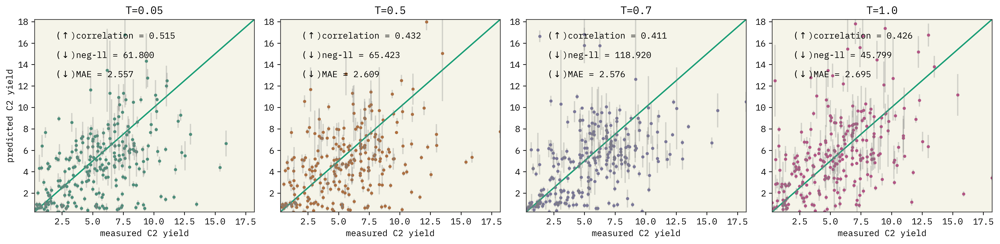

In [19]:
plot_parities(c2_data, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="multi") & (c2_data['model']=="text-davinci-003")]['N_train'].unique()), 
              nrows=1, ncols=1,
              data='C2', 
              k=5, 
              T=0.05, 
              model='text-davinci-001',
              model_class='multi', 
              N=None,
              axis_name="C2 yield",
              out_name="par_C2_multi_N_davinci.png")

plot_parities(c2_data, 
              'T', 
              [0.05, 0.5, 0.7, 1.0], #,sorted(c2_data[(c2_data['model_class']=="multi") & (c2_data['model']=="text-davinci-003")]['N_train'].unique()), 
              nrows=1, ncols=4,
              data='C2', 
              k=5, 
              T=None, 
              model='text-davinci-003',
              model_class='multi', 
              N=1000,
              axis_name="C2 yield",
              out_name="par_C2_multi_T_davinci.png")

multi(N:1000/k:5/T:0.05) => RMSE: | MAE: 2.5572037795275593 | r: 0.514603934796471 | nll: 61.80039744575777
multi(N:1000/k:5/T:0.5) => RMSE: | MAE: 2.6092917401574804 | r: 0.4320391363867014 | nll: 65.42250272125695
multi(N:1000/k:5/T:0.7) => RMSE: | MAE: 2.5756050944881888 | r: 0.41075910204755844 | nll: 118.91967224207772
multi(N:1000/k:5/T:1.0) => RMSE: | MAE: 2.6946190826771654 | r: 0.42561629604300444 | nll: 45.799220610752315


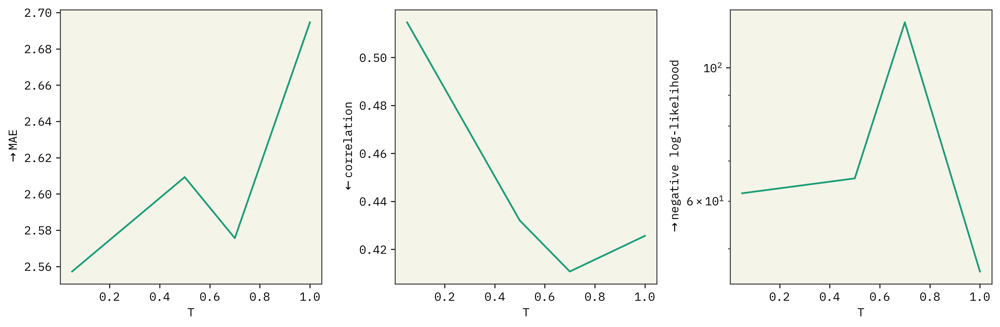

In [20]:
# plot_ablation(c2_data, 
#               'N', 
#               sorted(c2_data[(c2_data['model_class']=="multi") & (c2_data['model']=="text-davinci-003")]['N_train'].unique()), 
#               nrows=1, ncols=3,
#               data='C2',
#               k=5,
#               T=0.05,
#               model='text-davinci-003',
#               model_class='multi',
#               N=None,
#               out_name="ablation_C2_multi_N_davinci.png")

plot_ablation(c2_data, 
              'T', 
              sorted(c2_data[(c2_data['model_class']=="multi") & (c2_data['model']=="text-davinci-003")]['Temperature'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=5,
              T=None,
              model='text-davinci-003',
              model_class='multi',
              N=1000,
              out_name="ablation_C2_multi_T_davinci.png")

### topk

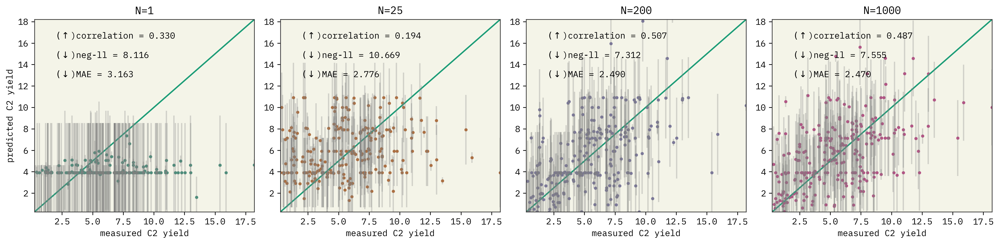

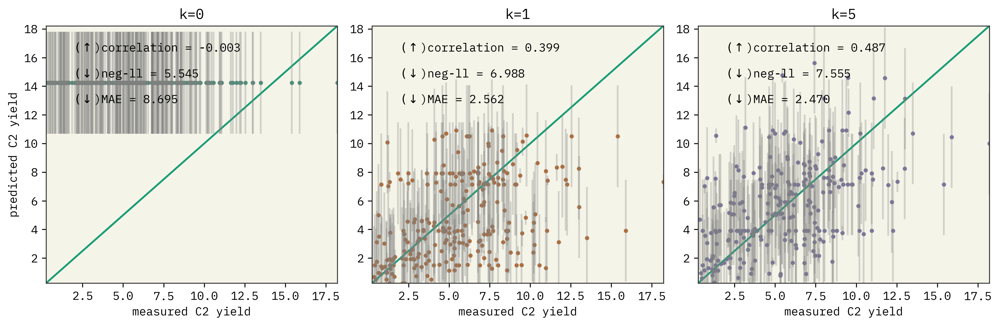

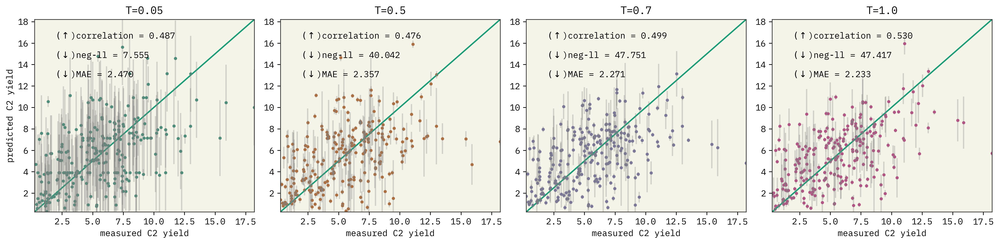

In [21]:
plot_parities(df, 
              'N', 
              [1,25,200,1000], #sorted(c2_data[(c2_data['model_class']=="topk") & (c2_data['model']=="text-curie-001")]['N_train'].unique()), 
              nrows=1, ncols=4,
              data='C2', 
              k=5, 
              T=0.05, 
              model='text-curie-001', 
              model_class='topk', 
              N=None,
              axis_name="C2 yield",
              out_name="par_C2_topk_N_curie.png")

plot_parities(df, 
              'k', 
              [0,1,5], #sorted(c2_data[(c2_data['model_class']=="topk") & (c2_data['model']=="text-curie-001")]['k_selected'].unique()), 
              nrows=1, ncols=3,
              data='C2', 
              k=None, 
              T=0.05, 
              model='text-curie-001', 
              model_class='topk', 
              N=1000,
              axis_name="C2 yield",
              out_name="par_C2_topk_k_curie.png")

plot_parities(df, 
              'T', 
              [0.05,0.5,0.7,1.0], #sorted(c2_data[(c2_data['model_class']=="topk") & (c2_data['model']=="text-curie-001")]['k_selected'].unique()), 
              nrows=1, ncols=4,
              data='C2', 
              k=5, 
              T=None, 
              model='text-curie-001', 
              model_class='topk', 
              N=1000,
              axis_name="C2 yield",
              out_name="par_C2_topk_T_curie.png")

topk(N:1/k:5/T:0.05) => RMSE: | MAE: 3.163165088983051 | r: 0.3300857379053024 | nll: 8.11563889824477
topk(N:5/k:5/T:0.05) => RMSE: | MAE: 2.9308498582677167 | r: 0.3183486140925472 | nll: 12.443225945410758
topk(N:10/k:5/T:0.05) => RMSE: | MAE: 3.0671994842519683 | r: 0.22089243552327026 | nll: 9.514915842608895
topk(N:25/k:5/T:0.05) => RMSE: | MAE: 2.77595998031496 | r: 0.1940445970750645 | nll: 10.669122480505795
topk(N:50/k:5/T:0.05) => RMSE: | MAE: 2.9569049015748035 | r: 0.2461031719062638 | nll: 6.831457015694036
topk(N:100/k:5/T:0.05) => RMSE: | MAE: 2.635870279527559 | r: 0.44264088757259923 | nll: 5.188810270649241
topk(N:200/k:5/T:0.05) => RMSE: | MAE: 2.490416047244094 | r: 0.5071816845937923 | nll: 7.312246770194268
topk(N:500/k:5/T:0.05) => RMSE: | MAE: 2.731028728346457 | r: 0.4035781916231333 | nll: 6.762306265459534
topk(N:1000/k:5/T:0.05) => RMSE: | MAE: 2.470140771653543 | r: 0.48737763511553406 | nll: 7.5549802118519285
topk(N:1000/k:0/T:0.05) => RMSE: | MAE: 8.694

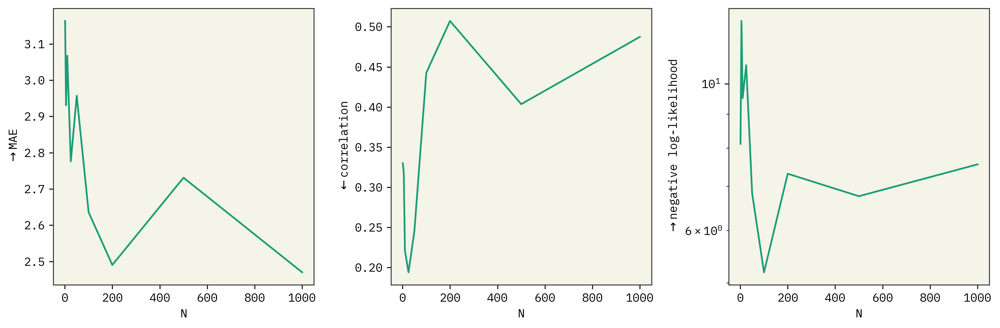

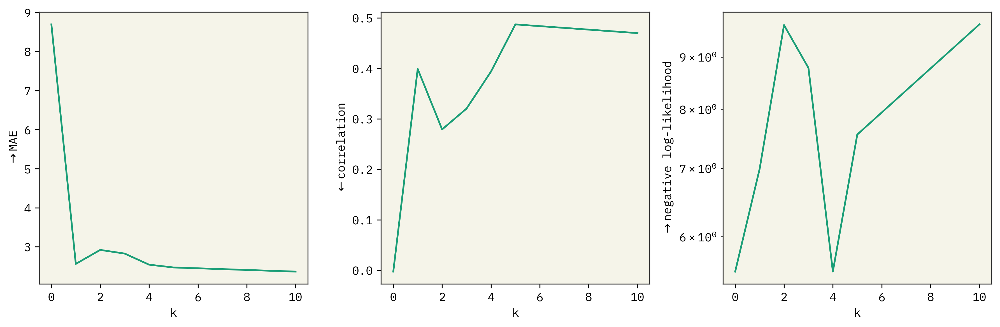

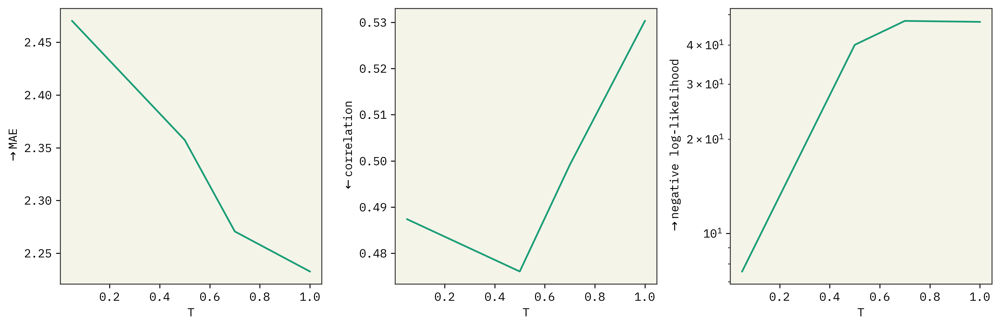

In [22]:
plot_ablation(df, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="topk") & (c2_data['model']=="text-curie-001")]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=5,
              T=0.05,
              model='text-curie-001',
              model_class='topk',
              N=None,
              out_name="ablation_C2_topk_N_curie.png")

plot_ablation(df, 
              'k', 
              sorted(c2_data[(c2_data['model_class']=="topk") & (c2_data['model']=="text-curie-001")]['k_selected'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=None,
              T=0.05,
              model='text-curie-001',
              model_class='topk',
              N=1000,
              out_name="ablation_C2_topk_k_curie.png")

plot_ablation(df, 
              'T', 
              sorted(c2_data[(c2_data['model_class']=="topk") & (c2_data['model']=="text-curie-001")]['Temperature'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=5,
              T=None,
              model='text-curie-001',
              model_class='topk',
              N=1000,
              out_name="ablation_C2_topk_T_curie.png")

### topk-davinci

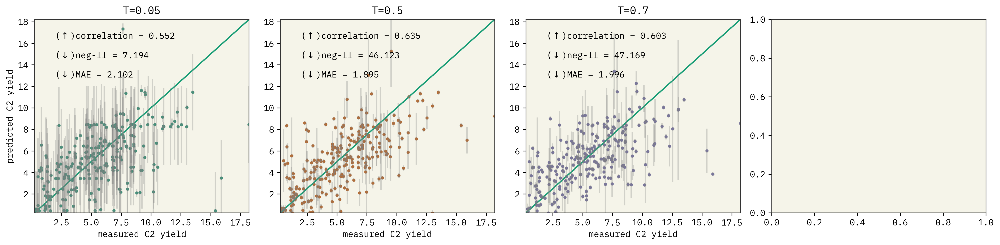

In [23]:
plot_parities(c2_data, 
              'T', 
              sorted(c2_data[(c2_data['model_class']=="topk") & (c2_data['model']=="text-davinci-003")]['Temperature'].unique()), 
              nrows=1, ncols=4,
              data='C2',
              k=5,
              T=None,
              model='text-davinci-003',
              model_class='topk',
              N=1000,
              axis_name="C2 yield",
              out_name="par_C2_multi_T_curie.png")

topk(N:1000/k:5/T:0.05) => RMSE: | MAE: 2.1016385078740156 | r: 0.5519781434814199 | nll: 7.194365471153501
topk(N:1000/k:5/T:0.05) => RMSE: | MAE: 2.1016385078740156 | r: 0.5519781434814199 | nll: 7.194365471153501
topk(N:1000/k:5/T:0.5) => RMSE: | MAE: 1.8951428464566933 | r: 0.634948779162096 | nll: 46.122713945951055
topk(N:1000/k:5/T:0.7) => RMSE: | MAE: 1.9957737874015746 | r: 0.6025274803856061 | nll: 47.169217830380894


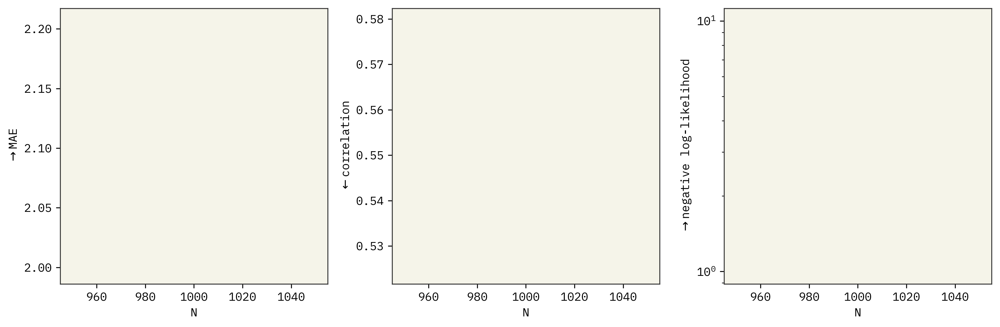

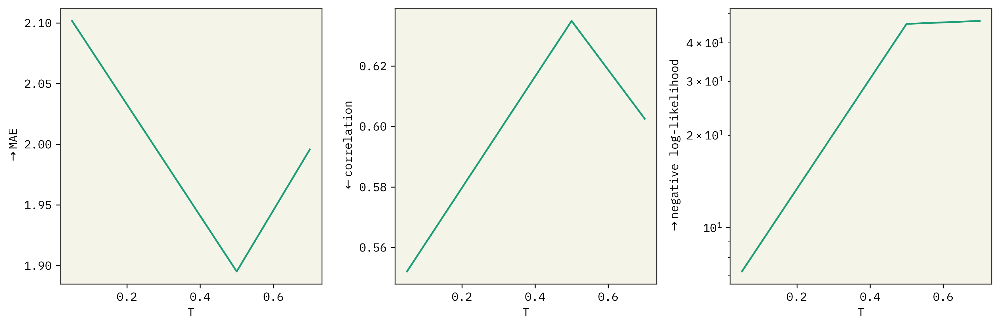

In [24]:
plot_ablation(c2_data, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="topk") & (c2_data['model']=="text-davinci-003")]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=5,
              T=0.05,
              model='text-davinci-003',
              model_class='topk',
              N=None,
              out_name="ablation_C2_topk_N_davinci.png")

plot_ablation(c2_data, 
              'T', 
              sorted(c2_data[(c2_data['model_class']=="topk") & (c2_data['model']=="text-davinci-003")]['Temperature'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=5,
              T=None,
              model='text-davinci-003',
              model_class='topk',
              N=1000,
              out_name="ablation_C2_multi_T_davinci.png")

### GPR

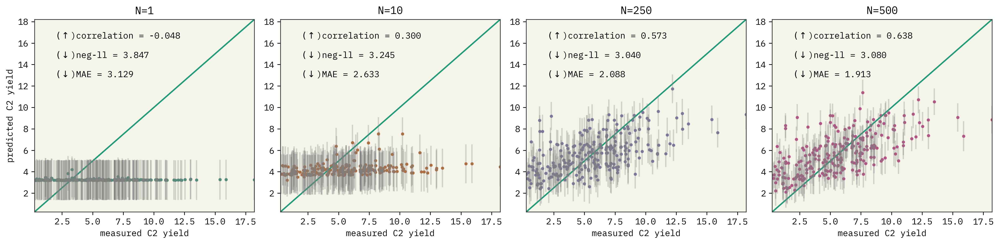

In [25]:
plot_parities(c2_data, 
              'N', 
              [1,10,250,500], #sorted(c2_data[(c2_data['model_class']=="GPR-BOT") & (c2_data['model']=="text-ada-001")]['N_train'].unique()), 
              nrows=1, ncols=4,
              data='C2', 
              k=32, 
              T=0.05, 
              model='text-ada-001', 
              model_class='GPR-BOT', 
              N=None,
              axis_name="C2 yield",
              out_name="par_C2_GPR_N_ada.png",
              GPR=True)

GPR-BOT(N:1/k:32/T:0.05) => RMSE: | MAE: 3.128552435364609 | r: -0.04842236473749727 | nll: 3.847331199206658
GPR-BOT(N:5/k:32/T:0.05) => RMSE: | MAE: 3.1466280997696665 | r: 0.10744841767981744 | nll: 4.1831717250264395
GPR-BOT(N:10/k:32/T:0.05) => RMSE: | MAE: 2.633199768571332 | r: 0.2996159344324876 | nll: 3.2452687619783367
GPR-BOT(N:25/k:32/T:0.05) => RMSE: | MAE: 2.516234638425279 | r: 0.24739966734466784 | nll: 3.1686662423545413
GPR-BOT(N:50/k:32/T:0.05) => RMSE: | MAE: 2.350941154382116 | r: 0.44174129695845643 | nll: 2.9243474872297823
GPR-BOT(N:100/k:32/T:0.05) => RMSE: | MAE: 2.290529820156631 | r: 0.46635758864198595 | nll: 3.091761997714477
GPR-BOT(N:250/k:32/T:0.05) => RMSE: | MAE: 2.087974792798477 | r: 0.5726701950585897 | nll: 3.0400179101225997
GPR-BOT(N:500/k:32/T:0.05) => RMSE: | MAE: 1.9126937481982502 | r: 0.6378417756547258 | nll: 3.079953194237171
GPR-BOT(N:1000/k:32/T:0.05) => RMSE: | MAE: 1.8926634667325803 | r: 0.6428592147099136 | nll: 3.3018419628977402
G

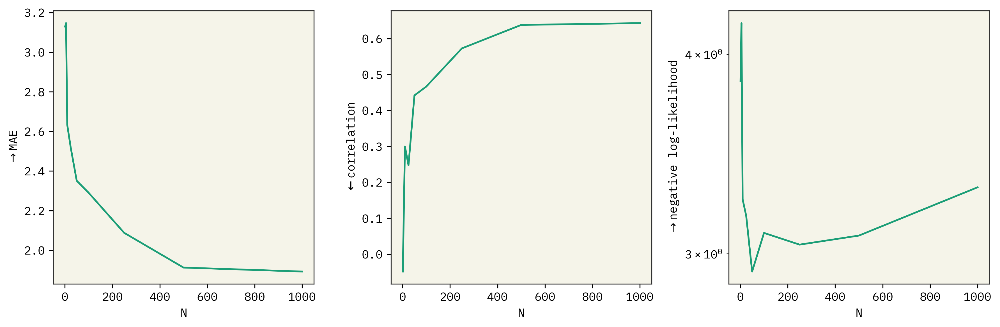

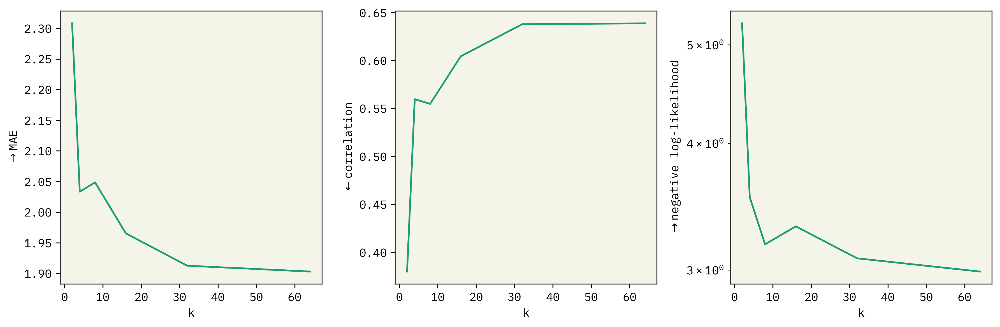

In [26]:
plot_ablation(c2_data, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="GPR-BOT") & (c2_data['model']=="text-ada-001")]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=32,
              T=0.05,
              model='text-ada-001',
              model_class='GPR-BOT',
              N=None,
              out_name="ablation_C2_GPR_N_ada.png",
              GPR=True)

plot_ablation(c2_data, 
              'k',
              sorted(c2_data[(c2_data['model_class']=="GPR-BOT") & (c2_data['model']=="text-ada-001")]['k_selected'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=None,
              T=0.05,
              model='text-ada-001',
              model_class='GPR-BOT',
              N=500,
              out_name="ablation_C2_GPR_N_ada.png",
              GPR=True)

### finetune

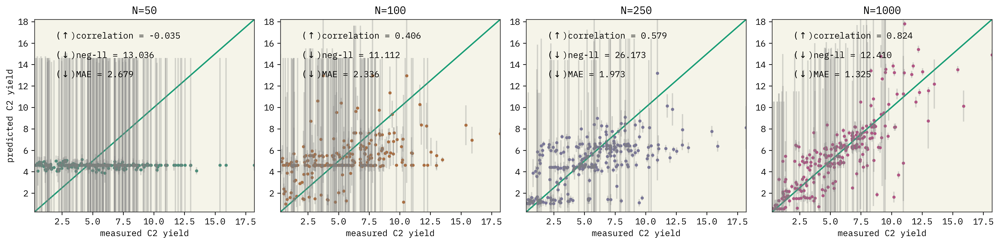

In [23]:
plot_parities(c2_data, 
              'N', 
              [50,100,250,1000], #sorted(c2_data[(c2_data['model_class']=="finetune")]['N_train'].unique()), 
              nrows=1, ncols=4,
              data='C2', 
              k=0, 
              T=0.05, 
              model='any', 
              model_class='finetune', 
              N=None,
              axis_name="C2 yield",
              out_name="par_C2_FT_N_ada.png")

finetune(N:10/k:0/T:0.05) => RMSE: | MAE: 3.8797187992125983 | r: 0.11563215189856597 | nll: 45.941132130648086
finetune(N:50/k:0/T:0.05) => RMSE: | MAE: 2.6785573622047245 | r: -0.03473419228779168 | nll: 13.036101755529332
finetune(N:100/k:0/T:0.05) => RMSE: | MAE: 2.335978846456693 | r: 0.40588071023617694 | nll: 11.111523854884238
finetune(N:250/k:0/T:0.05) => RMSE: | MAE: 1.9731422440944881 | r: 0.5793129256113266 | nll: 26.173214344777243
finetune(N:500/k:0/T:0.05) => RMSE: | MAE: 1.5269583858267717 | r: 0.797375287703067 | nll: 9.17965437646033
finetune(N:1000/k:0/T:0.05) => RMSE: | MAE: 1.3253983228346455 | r: 0.8238818209471482 | nll: 12.409715366921267


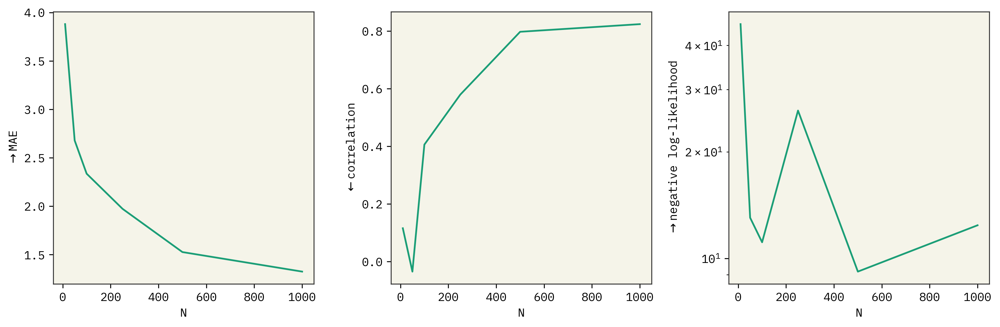

In [28]:
plot_ablation(df, 
              'N', 
              sorted(c2_data[(c2_data['model_class']=="finetune")]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='C2',
              k=0,
              T=0.05,
              model='any',
              model_class='finetune',
              N=None,
              out_name="ablation_C2_FT_N_ada.png")

### curie X davinci

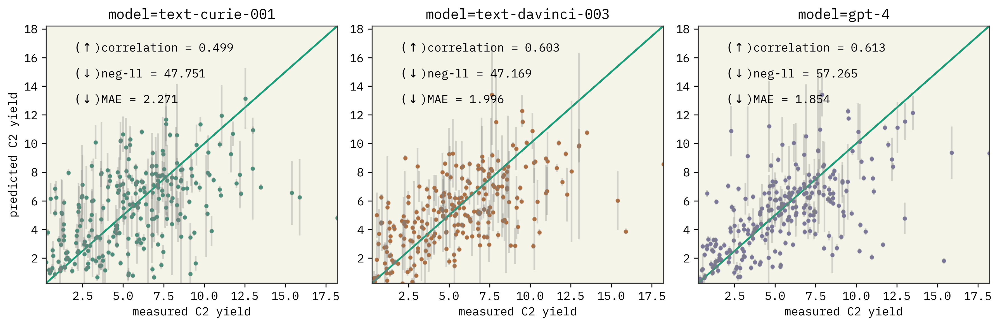

In [29]:
df_models = df[
    (df['model_class']=="topk") &
    ((df['model']=="text-curie-001") | (df['model']=="text-davinci-003") | (df['model']=="gpt-4")) &
    (df['k_selected']==5) &
    (df['Temperature']==0.7)
]
df_models
plot_parities(df_models, 
              'model', 
              [
                "text-curie-001",
                "text-davinci-003",
                "gpt-4"
              ], #sorted(c2_data[c2_data['model_class']=="multi"]['model'].unique()), 
              nrows=1, ncols=3,
              data='C2', 
              k=5,
              T=0.7,
              model=None,
              model_class='topk', 
              N=1000,
              axis_name="C2 yield",
              out_name="par_C2_topk_N_curieXdavinci.png")

## iupac sol

In [30]:
iupac_sol_data = df[(df['data'] == 'iupac-sol')]
iupac_sol_data.groupby(['Temperature', 'data','k_selected', 'model_class', "N_train", "model"]).size().reset_index().sort_values(by=["model_class", "Temperature"])

,Temperature,data,k_selected,model_class,N_train,model,0
0,0.05,iupac-sol,0,GPR,1,text-ada-001,354
1,0.05,iupac-sol,0,GPR,5,text-ada-001,177
2,0.05,iupac-sol,0,GPR,10,text-ada-001,177
3,0.05,iupac-sol,0,GPR,25,text-ada-001,177
4,0.05,iupac-sol,0,GPR,50,text-ada-001,177
...,...,...,...,...,...,...,...
66,0.05,iupac-sol,10,topk,700,text-curie-001,134
77,0.50,iupac-sol,5,topk,700,text-curie-001,429
79,0.70,iupac-sol,5,topk,700,text-curie-001,474
81,0.70,iupac-sol,10,topk,700,text-curie-001,391


### multi

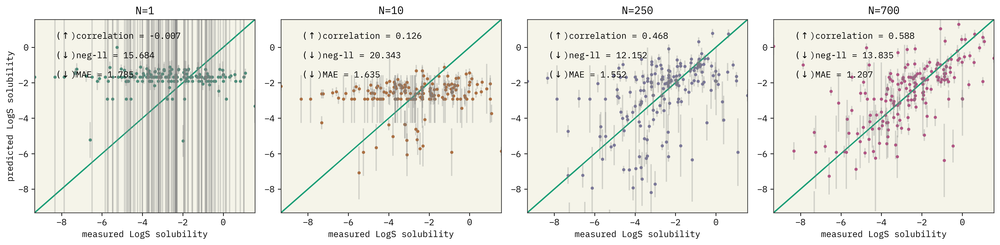

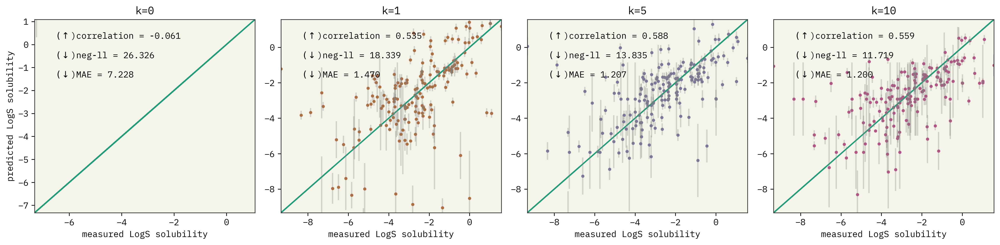

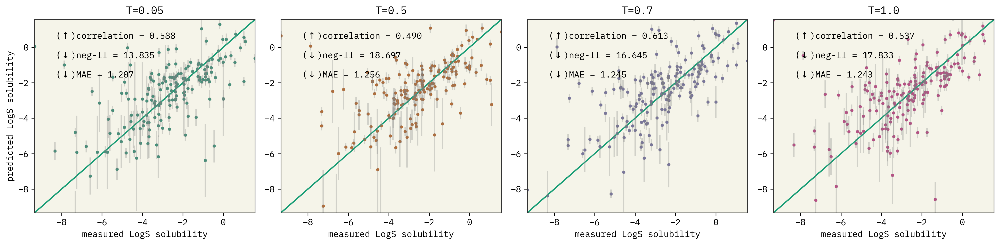

In [31]:
plot_parities(iupac_sol_data, 
              'N', 
              [1,10,250,700], #sorted(iupac_sol_data[iupac_sol_data['model_class']=="multi"]['N_train'].unique()), 
              nrows=1, ncols=4,
              data='iupac-sol', 
              k=5, 
              T=0.05, 
              model='text-curie-001', 
              model_class='multi', 
              N=None,
              axis_name="LogS solubility",
              out_name="par_sol_multi_N_curie.png")

plot_parities(iupac_sol_data, 
              'k', 
              [0,1,5,10], #sorted(iupac_sol_data[iupac_sol_data['model_class']=="multi"]['N_train'].unique()), 
              nrows=1, ncols=4,
              data='iupac-sol', 
              k=None,
              T=0.05, 
              model='text-curie-001',
              model_class='multi', 
              N=700,
              axis_name="LogS solubility",
              out_name="par_sol_multi_k_curie.png")

plot_parities(iupac_sol_data, 
              'T', 
              [0.05, 0.5, 0.7, 1.0], #sorted(iupac_sol_data[iupac_sol_data['model_class']=="multi"]['Temperature'].unique()), 
              nrows=1, ncols=4,
              data='iupac-sol',
              k=5,
              T=None,
              model='text-curie-001',
              model_class='multi', 
              N=700,
              axis_name="LogS solubility",
              out_name="par_sol_multi_k_curie.png")

multi(N:1/k:5/T:0.05) => RMSE: | MAE: 1.7852037954545452 | r: -0.006975971090071027 | nll: 15.683597855811456
multi(N:5/k:5/T:0.05) => RMSE: | MAE: 1.8126457102272726 | r: 0.0442741018178449 | nll: 17.70418571078519
multi(N:10/k:5/T:0.05) => RMSE: | MAE: 1.634872875 | r: 0.1257064313755391 | nll: 20.343457408364735
multi(N:25/k:5/T:0.05) => RMSE: | MAE: 1.8261719602272726 | r: 0.23479489379725998 | nll: 20.811193783169117
multi(N:50/k:5/T:0.05) => RMSE: | MAE: 1.7224852840909093 | r: 0.27881075549822815 | nll: 30.01423131410596
multi(N:100/k:5/T:0.05) => RMSE: | MAE: 1.510317806818182 | r: 0.4503759891389396 | nll: 16.483960769775145
multi(N:250/k:5/T:0.05) => RMSE: | MAE: 1.5515724261363635 | r: 0.46830725596184297 | nll: 12.151510877370844
multi(N:500/k:5/T:0.05) => RMSE: | MAE: 1.1893093863636361 | r: 0.5795794100595578 | nll: 11.594806263932352
multi(N:700/k:5/T:0.05) => RMSE: | MAE: 1.2069633181818182 | r: 0.5877699154922402 | nll: 13.835173184203605
multi(N:700/k:0/T:0.05) => RMS

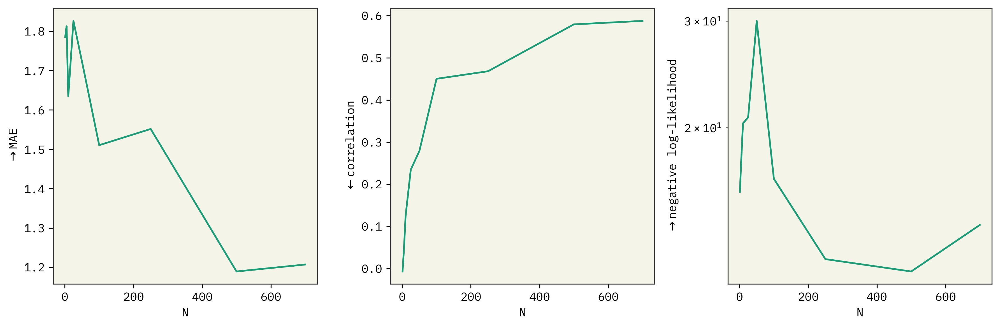

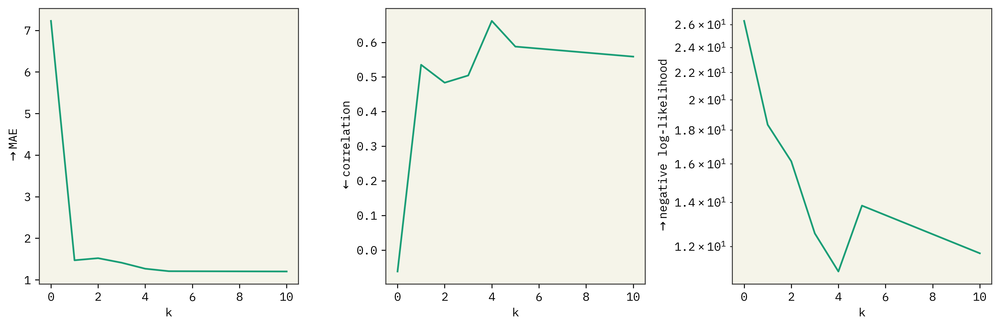

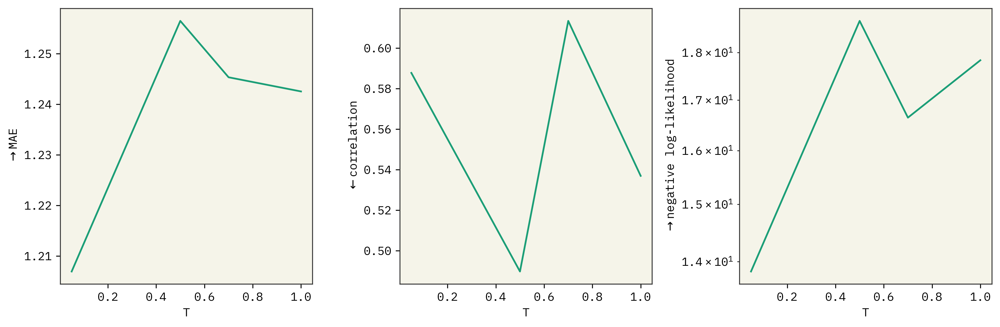

In [33]:
plot_ablation(iupac_sol_data, 
              'N', 
              sorted(iupac_sol_data[iupac_sol_data['model_class']=="multi"]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='iupac-sol',
              k=5,
              T=0.05,
              model='text-curie-001',
              model_class='multi',
              N=None,
              out_name="ablation_sol_multi_N_curie.png")

plot_ablation(iupac_sol_data, 
              'k', 
              sorted(iupac_sol_data[iupac_sol_data['model_class']=="multi"]['k_selected'].unique()), 
              nrows=1, ncols=3,
              data='iupac-sol',
              k=None,
              T=0.05,
              model='text-curie-001',
              model_class='multi',
              N=700,
              out_name="ablation_sol_multi_k_curie.png")

plot_ablation(iupac_sol_data, 
              'T', 
              sorted(iupac_sol_data[iupac_sol_data['model_class']=="multi"]['Temperature'].unique()), 
              nrows=1, ncols=3,
              data='iupac-sol',
              k=5,
              T=None,
              model='text-curie-001',
              model_class='multi',
              N=700,
              out_name="ablation_sol_multi_T_curie.png")

### topk

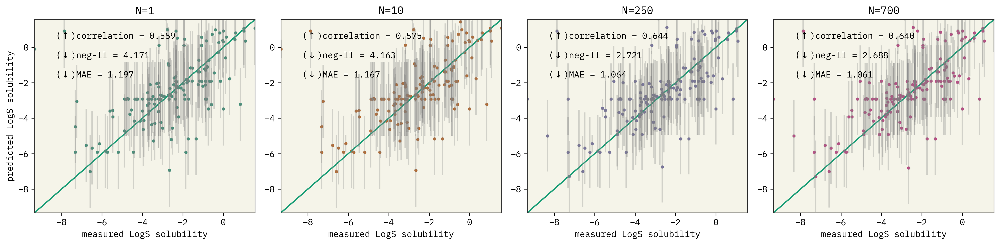

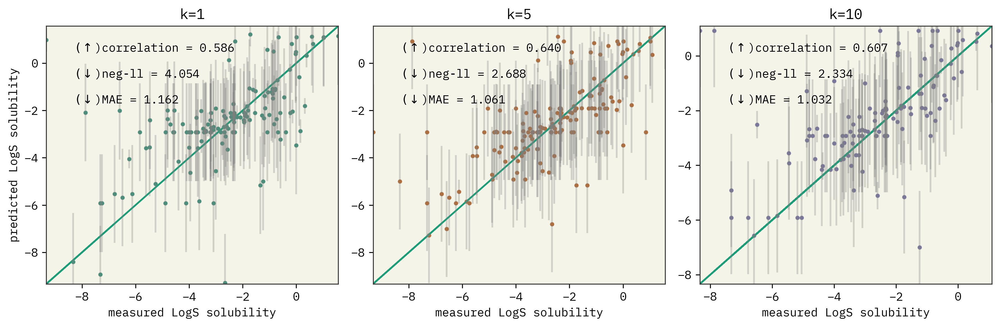

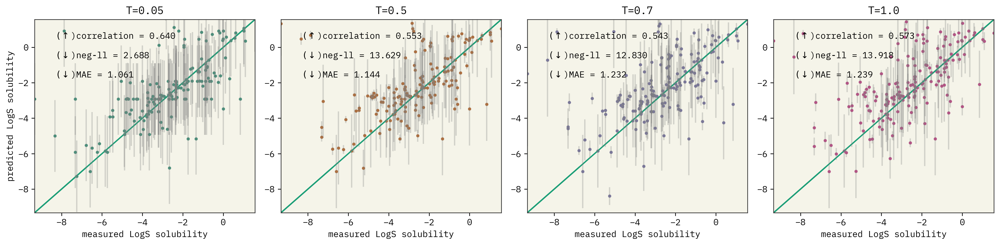

In [37]:
plot_parities(iupac_sol_data, 
              'N', 
              [1,10,250,700], #sorted(iupac_sol_data[iupac_sol_data['model_class']=="topk"]['N_train'].unique()), 
              nrows=1, ncols=4,
              data='iupac-sol', 
              k=5, 
              T=0.05, 
              model='text-curie-001', 
              model_class='topk',
              N=None,
              axis_name="LogS solubility",
              out_name="par_sol_topk_N_curie.png")

plot_parities(iupac_sol_data, 
              'k', 
              [1,5,10], #sorted(iupac_sol_data[iupac_sol_data['model_class']=="multi"]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='iupac-sol', 
              k=None,
              T=0.05, 
              model='text-curie-001', 
              model_class='topk', 
              N=700,
              axis_name="LogS solubility",
              out_name="par_sol_topk_k_curie.png")

plot_parities(iupac_sol_data, 
              'T', 
              [0.05, 0.5, 0.7, 1.0], #sorted(iupac_sol_data[iupac_sol_data['model_class']=="multi"]['N_train'].unique()), 
              nrows=1, ncols=4,
              data='iupac-sol', 
              k=5,
              T=None, 
              model='text-curie-001', 
              model_class='topk', 
              N=700,
              axis_name="LogS solubility",
              out_name="par_sol_topk_T_curie.png")

topk(N:1/k:5/T:0.05) => RMSE: | MAE: 1.197123141025641 | r: 0.5593745300138282 | nll: 4.17120383083409
topk(N:5/k:5/T:0.05) => RMSE: | MAE: 1.0981143006134968 | r: 0.608701551000906 | nll: 3.7118114947108323
topk(N:10/k:5/T:0.05) => RMSE: | MAE: 1.167118012820513 | r: 0.5746813874599329 | nll: 4.162528990187401
topk(N:25/k:5/T:0.05) => RMSE: | MAE: 1.075367987951807 | r: 0.6687149991868326 | nll: 2.311721046352937
topk(N:50/k:5/T:0.05) => RMSE: | MAE: 1.1565021006289307 | r: 0.5814912212494271 | nll: 4.106063422430171
topk(N:100/k:5/T:0.05) => RMSE: | MAE: 1.1065850573248408 | r: 0.585659251682102 | nll: 4.111824152723738
topk(N:250/k:5/T:0.05) => RMSE: | MAE: 1.0635497212121212 | r: 0.643780321456523 | nll: 2.721350568246476
topk(N:500/k:5/T:0.05) => RMSE: | MAE: 1.0402707710843373 | r: 0.6821119416438863 | nll: 2.2513759385366785
topk(N:700/k:5/T:0.05) => RMSE: | MAE: 1.0605655487804877 | r: 0.6403034114888309 | nll: 2.6877062217377894
topk(N:700/k:1/T:0.05) => RMSE: | MAE: 1.1622825

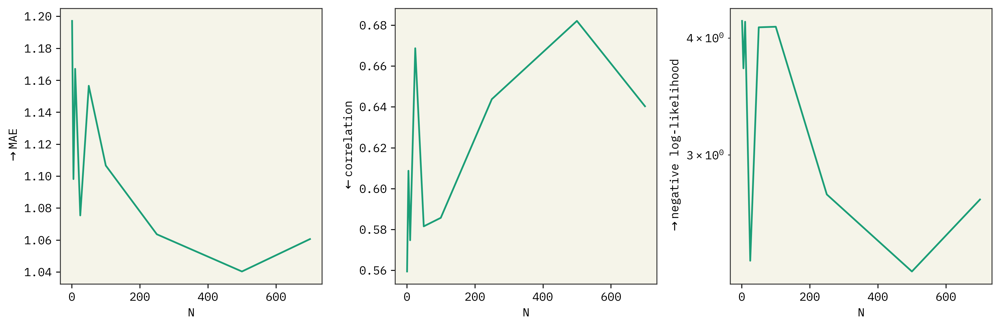

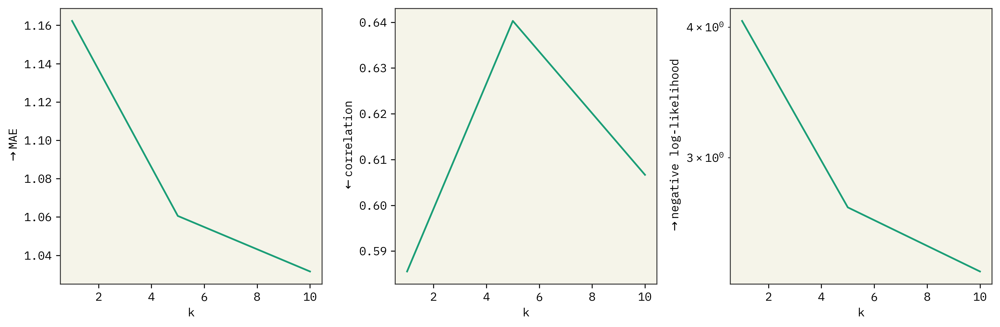

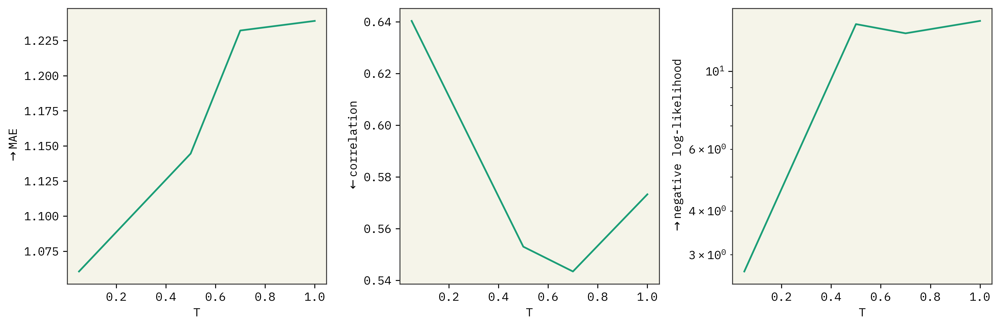

In [38]:
plot_ablation(iupac_sol_data, 
              'N', 
              sorted(iupac_sol_data[iupac_sol_data['model_class']=="topk"]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='iupac-sol',
              k=5,
              T=0.05,
              model='text-curie-001',
              model_class='topk',
              N=None,
              out_name="ablation_sol_topk_N_curie.png")

plot_ablation(iupac_sol_data, 
              'k', 
              [1,5,10], #sorted(iupac_sol_data[iupac_sol_data['model_class']=="topk"]['k_selected'].unique()), 
              nrows=1, ncols=3,
              data='iupac-sol',
              k=None,
              T=0.05,
              model='text-curie-001',
              model_class='topk',
              N=700,
              out_name="ablation_sol_topk_k_curie.png")

plot_ablation(iupac_sol_data, 
              'T', 
              sorted(iupac_sol_data[iupac_sol_data['model_class']=="topk"]['Temperature'].unique()), 
              nrows=1, ncols=3,
              data='iupac-sol',
              k=5,
              T=None,
              model='text-curie-001',
              model_class='topk',
              N=700,
              out_name="ablation_sol_topk_T_curie.png")

### GPR

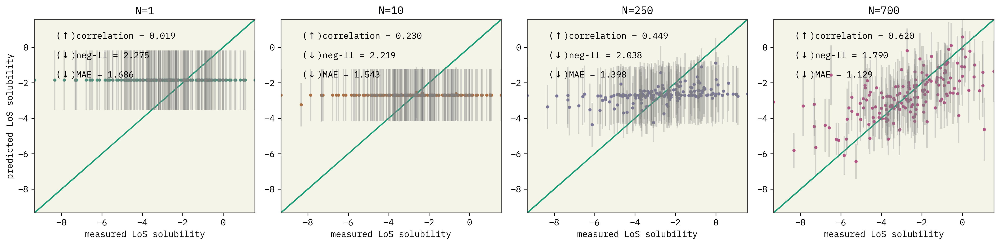

In [39]:
plot_parities(iupac_sol_data, 
              'N', 
              [1,10,250,700], #sorted(iupac_sol_data[(iupac_sol_data['model_class']=="GPR-BOT") & (iupac_sol_data['model']=="text-ada-001")]['N_train'].unique()), 
              nrows=1, ncols=4,
              data='iupac-sol', 
              k=32, 
              T=0.05, 
              model='text-ada-001', 
              model_class='GPR-BOT', 
              N=None,
              axis_name="LoS solubility",
              out_name="par_sol_GPR_N_ada.png",
              GPR=True)

GPR-BOT(N:1/k:32/T:0.05) => RMSE: | MAE: 1.7018990243742727 | r: -0.0025700514365893184 | nll: 2.28663470223527
GPR-BOT(N:5/k:32/T:0.05) => RMSE: | MAE: 1.5886039739002917 | r: 0.0200933701176011 | nll: 2.2232333125994908
GPR-BOT(N:10/k:32/T:0.05) => RMSE: | MAE: 1.5703375302842373 | r: 0.02550767672961115 | nll: 2.252961150109712
GPR-BOT(N:25/k:32/T:0.05) => RMSE: | MAE: 1.5776821682003734 | r: 0.018011467982156866 | nll: 2.2341161311347197
GPR-BOT(N:50/k:32/T:0.05) => RMSE: | MAE: 1.5774929156773034 | r: 0.05640640999365178 | nll: 2.2641903189083084
GPR-BOT(N:100/k:32/T:0.05) => RMSE: | MAE: 1.5166348645803351 | r: 0.24620171598142898 | nll: 2.224752071993692
GPR-BOT(N:250/k:32/T:0.05) => RMSE: | MAE: 1.4068996752884597 | r: 0.4243061242209963 | nll: 2.047395579934722
GPR-BOT(N:500/k:32/T:0.05) => RMSE: | MAE: 1.2169766175145558 | r: 0.5779803888426668 | nll: 1.8411137749398743
GPR-BOT(N:700/k:32/T:0.05) => RMSE: | MAE: 1.1306055114245142 | r: 0.619226254495793 | nll: 1.7913345431292

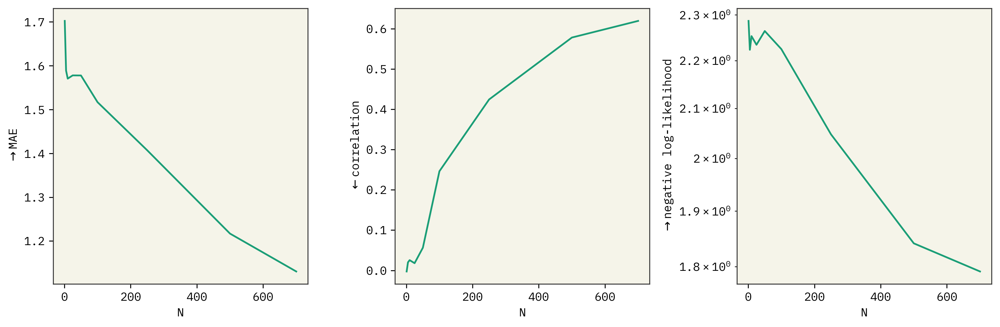

In [40]:
plot_ablation(df, 
              'N', 
              sorted(iupac_sol_data[(iupac_sol_data['model_class']=="GPR-BOT") & (iupac_sol_data['model']=="text-ada-001")]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='iupac-sol',
              k=32,
              T=0.05,
              model='text-ada-001',
              model_class='GPR-BOT',
              N=None,
              out_name="ablation_sol_GPR_N_ada.png")

### finetune

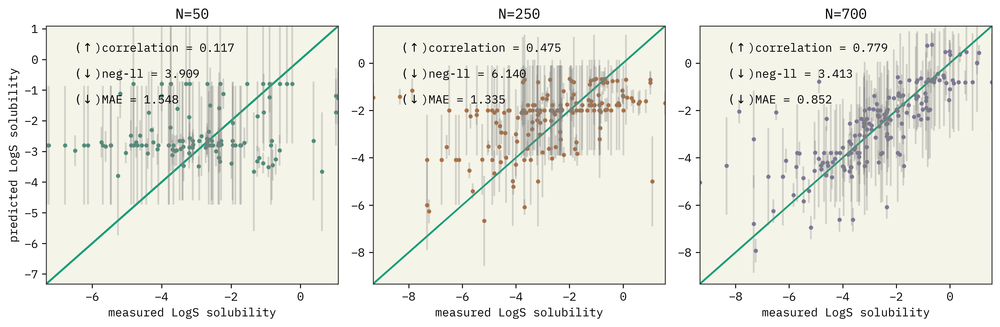

In [41]:
plot_parities(iupac_sol_data, 
              'N', 
              [50, 250, 700],#sorted(iupac_sol_data[iupac_sol_data['model_class']=="finetune"]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='iupac-sol', 
              k=0, 
              T=0.05, 
              model='any', 
              model_class='finetune', 
              N=None,
              axis_name="LogS solubility",
              out_name="par_sol_FT_N_ada.png")

finetune(N:50/k:0/T:0.05) => RMSE: | MAE: 1.5478898067796605 | r: 0.11683322682223181 | nll: 3.9094032711627413
finetune(N:100/k:0/T:0.05) => RMSE: | MAE: 1.434541875 | r: 0.3416921726110877 | nll: 7.559939324297589
finetune(N:250/k:0/T:0.05) => RMSE: | MAE: 1.3349807607954545 | r: 0.47496242555173335 | nll: 6.140465743328093
finetune(N:500/k:0/T:0.05) => RMSE: | MAE: 0.961012246590909 | r: 0.7130546421335748 | nll: 3.6812263838480614
finetune(N:700/k:0/T:0.05) => RMSE: | MAE: 0.8522657392045455 | r: 0.778769974381897 | nll: 3.4127971940761626


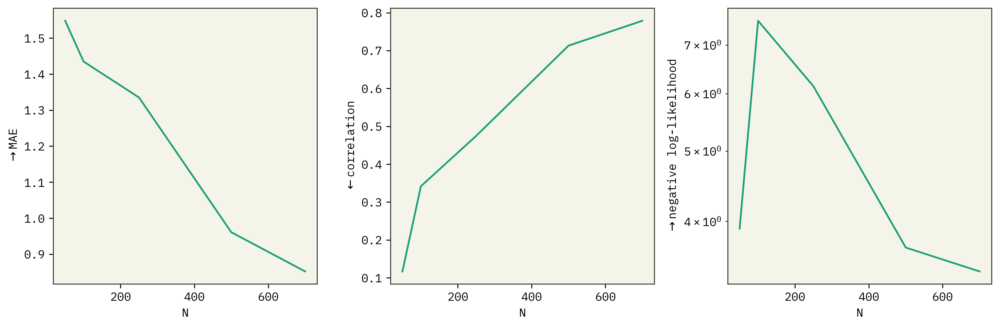

In [42]:
plot_ablation(iupac_sol_data, 
              'N', 
              sorted(iupac_sol_data[iupac_sol_data['model_class']=="finetune"]['N_train'].unique()), 
              nrows=1, ncols=3,
              data='iupac-sol',
              k=0,
              T=0.05,
              model='any',
              model_class='finetune',
              N=None,
              out_name="ablation_sol_FT_N_ada.png")

## alloy

In [ ]:
alloy_data = df[(df['data'] == 'alloy')]
alloy_data.groupby(['Temperature', 'k_selected', 'model_class', "N_train", "model"]).size().reset_index().sort_values(by=["model_class", "Temperature"])

,Temperature,k_selected,model_class,N_train,model,0
